In [46]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ball-bouncing-dataset/submit_solution_mapping.csv
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_9.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_29.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_21.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_34.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_41.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_15.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_14.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_18.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_7.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_40.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_6.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_45.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_only_ID_28.wav
/kaggle/input/ball-bouncing-dataset/audio_only/audio_on

## For this question, we have tried to figure the impulses in the audio, check the ball bounces by using python libraries, and then tried to match them by finding the pairs with the least distances between them

# Extract audio impulses

In [72]:
def extract_audio_impacts(audio_dir, height_threshold=0.1, min_distance=0.2):
    """Extract impact times for all audio files in the directory with adjustable thresholds."""
    audio_impacts = {}
    for audio_file in sorted(os.listdir(audio_dir)):
        if audio_file.endswith('.wav'):
            audio_id = os.path.basename(audio_file).split('_')[-1].split('.')[0]
            audio_path = os.path.join(audio_dir, audio_file)
            try:
                y, sr = librosa.load(audio_path, sr=None)
                
                # Normalize the audio signal
                y_abs = np.abs(y)
                y_max = np.max(y_abs)
                if y_max > 0:
                    y_norm = y_abs / y_max
                
                # Detect peaks with adaptive thresholds
                peaks, _ = find_peaks(
                    y_norm,
                    height=height_threshold,
                    distance=int(sr * min_distance)
                )
                
                # Convert peak indices to time
                impact_times = peaks / sr
                audio_impacts[audio_id] = impact_times
            
            except Exception as e:
                print(f"Error processing audio {audio_path}: {e}")
    
    return audio_impacts

audio_dir = '/kaggle/input/ball-bouncing-dataset/audio_only'
audio_impacts = extract_audio_impacts(audio_dir, height_threshold=0.5, min_distance=0.2)


## I have tried to adjust the height threshold to make it reasonable for the actual impulses

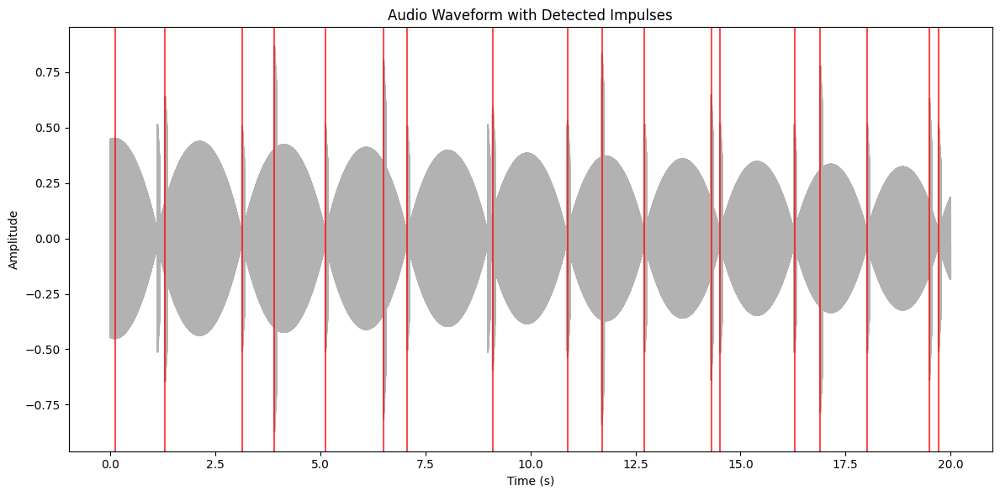

In [73]:
import matplotlib.pyplot as plt

def visualize_audio_with_impulses(audio_path, impact_times):
    """Visualize the waveform and detected impulses."""
    y, sr = librosa.load(audio_path, sr=None)
    time = np.arange(len(y)) / sr
    
    plt.figure(figsize=(12, 6))
    plt.plot(time, y, color='gray', alpha=0.6)
    
    # Mark impact times
    for t in impact_times:
        plt.axvline(x=t, color='r', alpha=0.7)
    
    plt.title('Audio Waveform with Detected Impulses')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()


audio_id = '34' 
audio_path = os.path.join(audio_dir, f'audio_only_ID_{audio_id}.wav')
visualize_audio_with_impulses(audio_path, audio_impacts[audio_id])


# Extract Video Bounces

In [74]:
import matplotlib.pyplot as plt

def visualize_ball_trajectory_and_bounces(video_id, positions, bounces):
    """Visualize the ball's trajectory and detected bounces."""
    plt.figure(figsize=(12, 6))
    
    # Plot ball trajectory
    x_positions = [pos[1][0] for pos in positions]
    y_positions = [pos[1][1] for pos in positions]
    times = [pos[0] for pos in positions]
    
    scatter = plt.scatter(x_positions, y_positions, c=times, cmap='viridis', alpha=0.7, s=10)
    plt.colorbar(scatter, label='Time (s)')
    
    # Mark bounce points
    bounce_positions = []
    for bounce_time in bounces:
        closest_idx = min(range(len(positions)), key=lambda i: abs(positions[i][0] - bounce_time))
        bounce_positions.append(positions[closest_idx][1])
    
    if bounce_positions:
        bounce_x = [pos[0] for pos in bounce_positions]
        bounce_y = [pos[1] for pos in bounce_positions]
        plt.scatter(bounce_x, bounce_y, color='red', s=100, marker='x', label='Bounces')
    
    plt.title(f'Ball Trajectory - Video {video_id}')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [21]:
def refine_video_bounces(positions, width, height, wall_threshold=10, min_time_between_bounces=0.1, velocity_threshold=2):
    """Refine bounce detection based on wall proximity and velocity changes."""
    bounces = []
    if len(positions) > 2:
        velocities_x = []
        velocities_y = []
        for i in range(1, len(positions)):
            dt = positions[i][0] - positions[i-1][0]
            if dt > 0:
                dx = positions[i][1][0] - positions[i-1][1][0]
                dy = positions[i][1][1] - positions[i-1][1][1]
                velocities_x.append((positions[i][0], dx/dt))
                velocities_y.append((positions[i][0], dy/dt))
        
        # Detect bounces
        for i in range(1, len(velocities_x)):
            # Horizontal bounce (left/right walls)
            # print(velocities_x[i][1], 
            if velocities_x[i][1] * velocities_x[i-1][1] < 0 and abs(velocities_x[i][1]) > velocity_threshold:
                x = positions[i][1][0]
                if x < wall_threshold or x > width - wall_threshold:
                    bounces.append(velocities_x[i][0])
            
            # Vertical bounce (top/bottom walls)
            if velocities_y[i][1] * velocities_y[i-1][1] < 0 and abs(velocities_y[i][1]) > velocity_threshold:
                y = positions[i][1][1]
                if y < wall_threshold or y > height - wall_threshold:
                    bounces.append(velocities_y[i][0])
    
    # Remove duplicate bounces
    unique_bounces = []
    for bounce in sorted(bounces):
        if not unique_bounces or bounce - unique_bounces[-1] > min_time_between_bounces:
            unique_bounces.append(bounce)
    
    return unique_bounces


In [22]:
import cv2

Processing video 1...


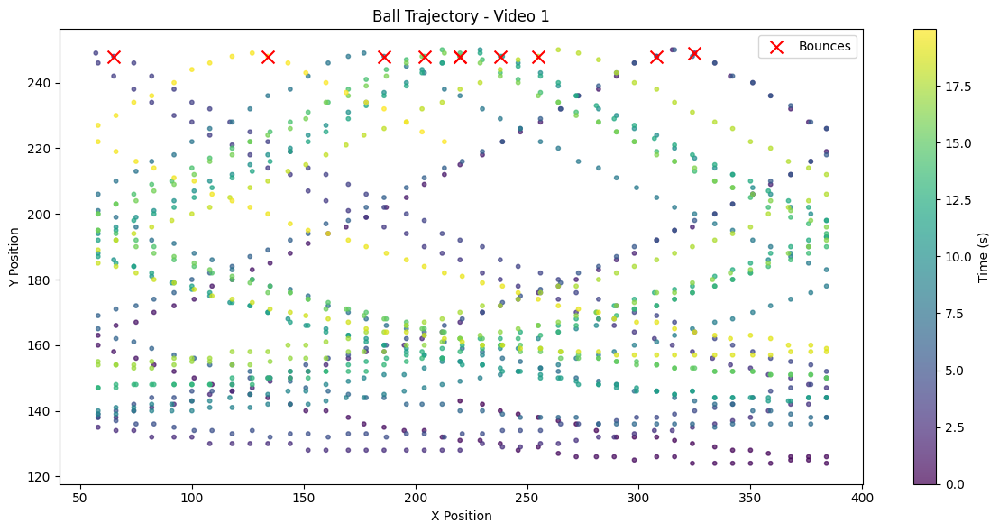

Processing video 10...


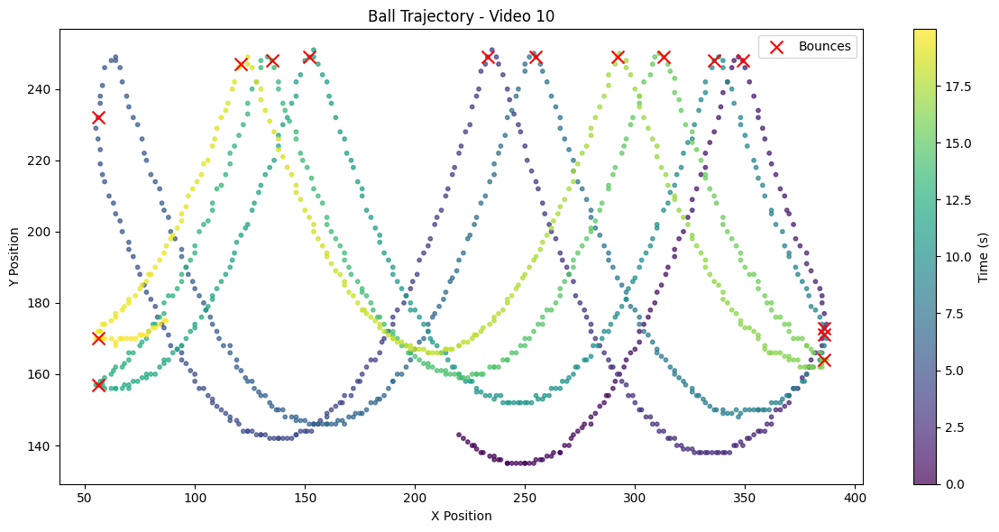

Processing video 11...


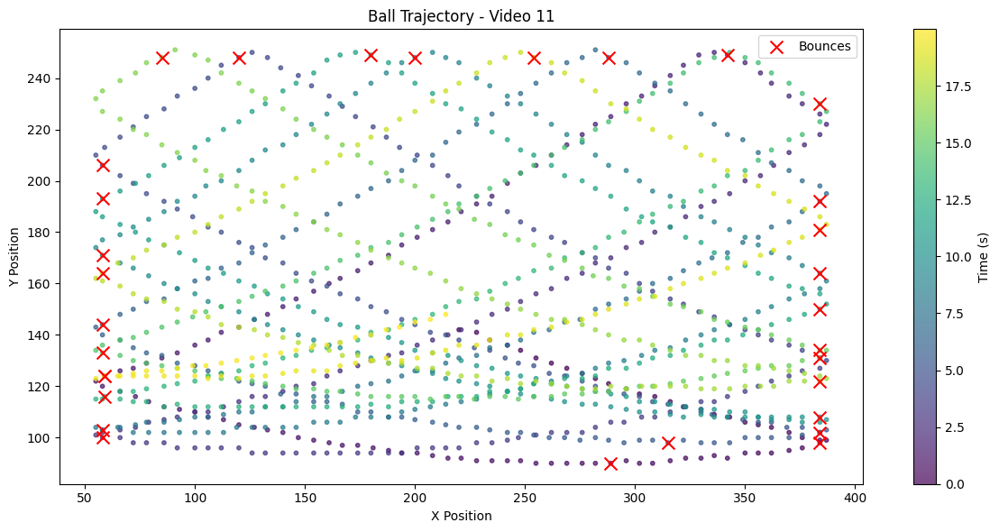

Processing video 12...


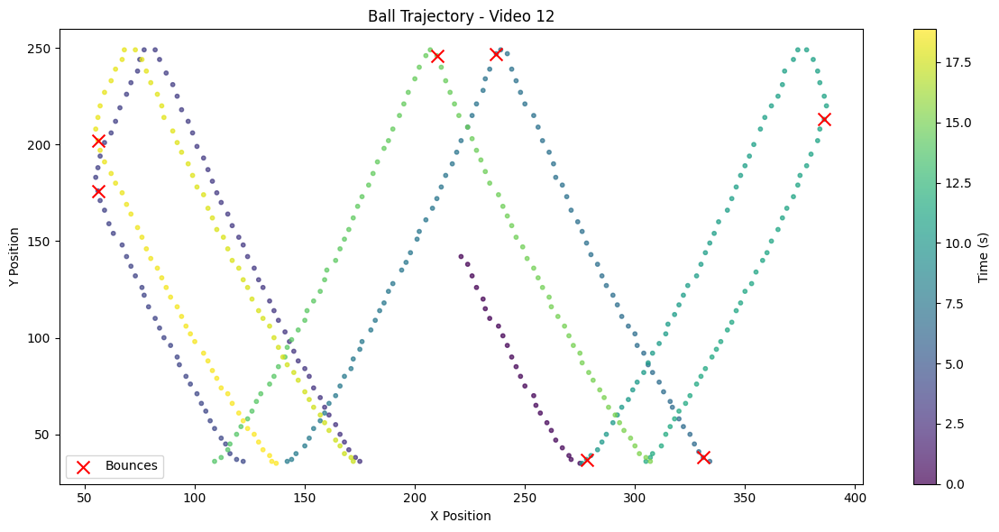

Processing video 13...


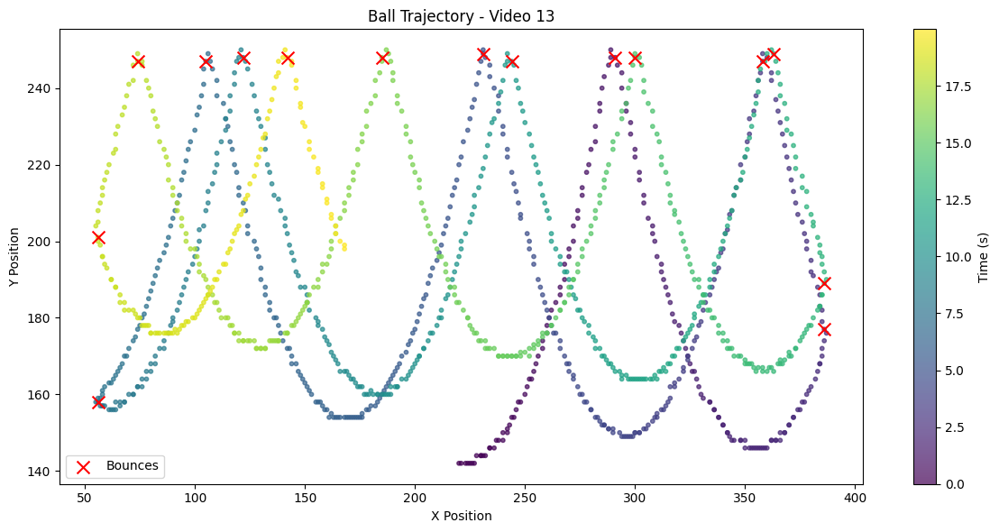

Processing video 14...


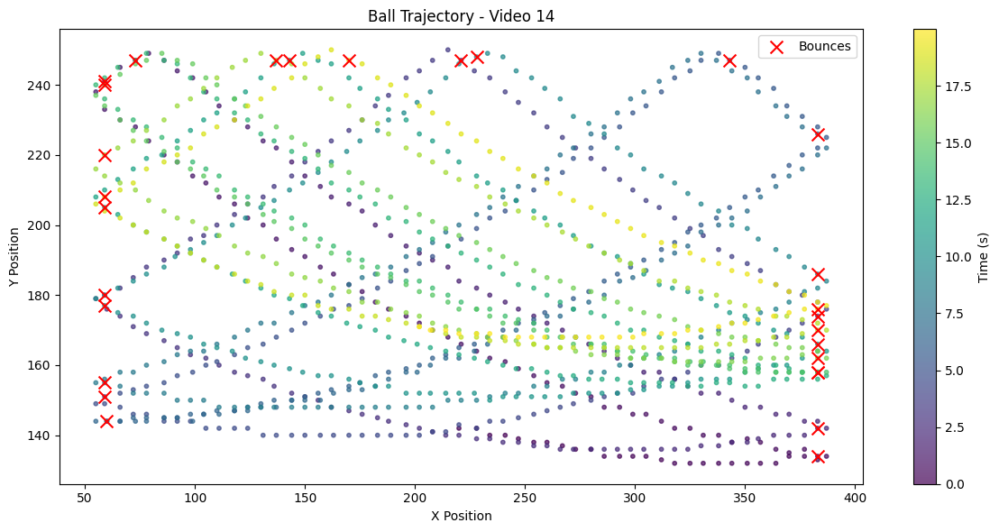

Processing video 15...


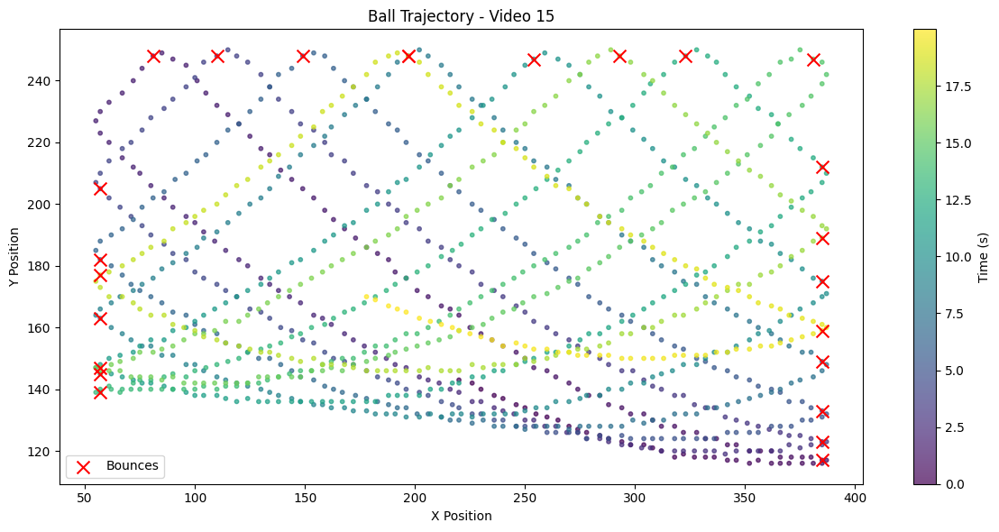

Processing video 16...


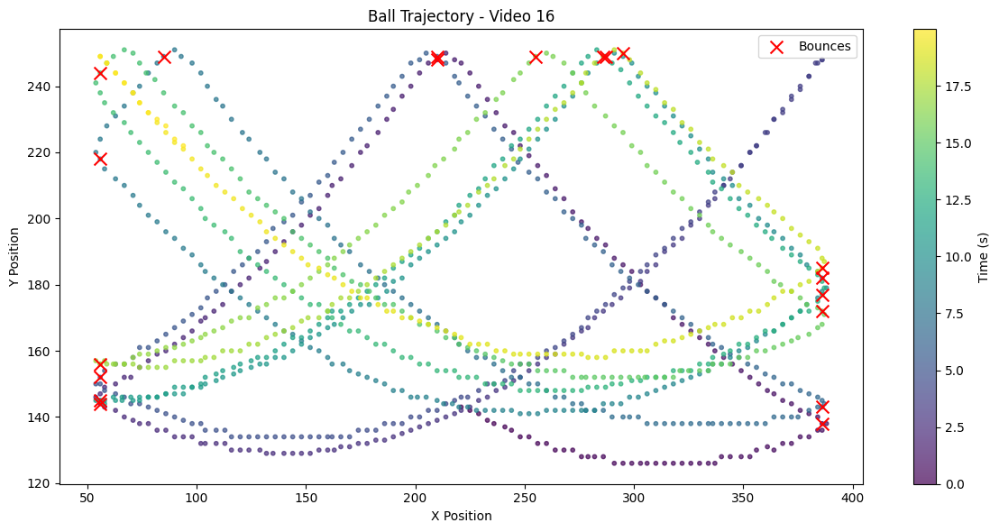

Processing video 17...


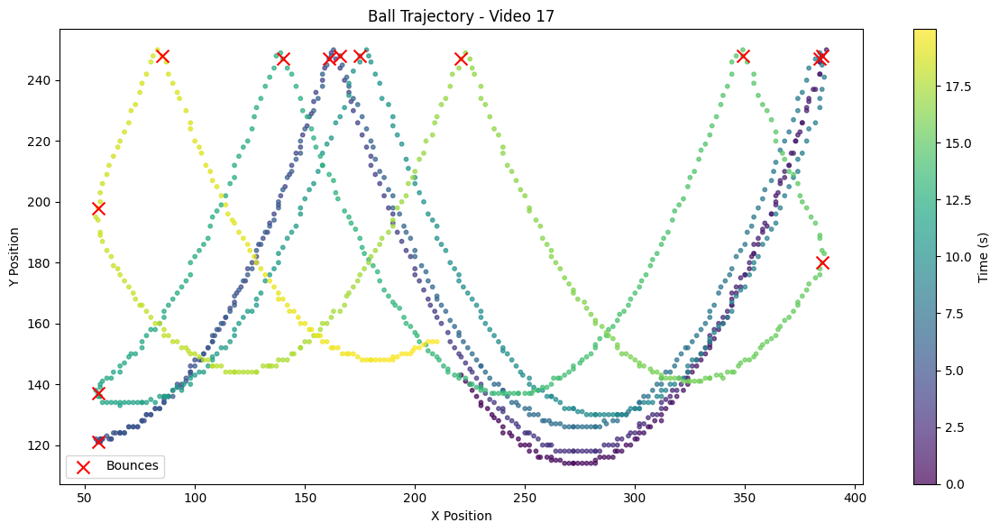

Processing video 18...


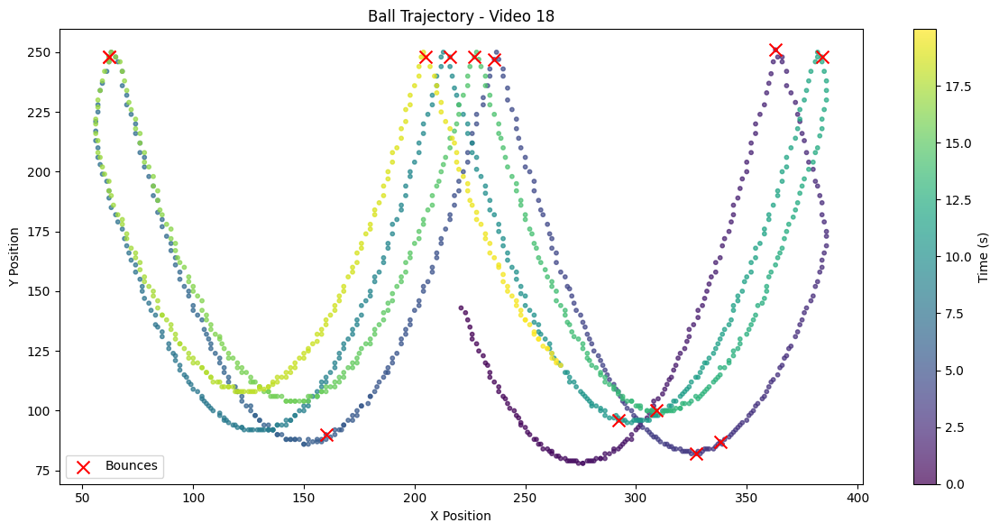

Processing video 19...


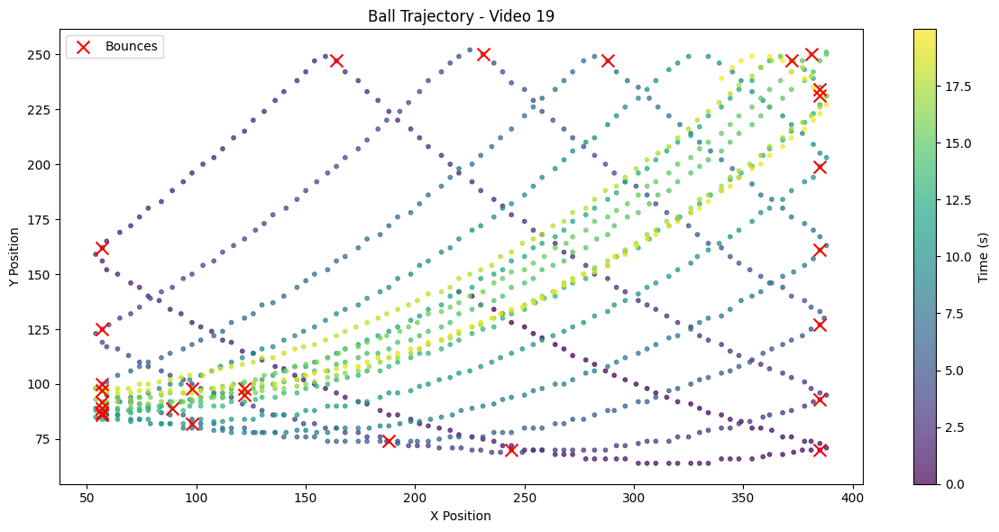

Processing video 2...


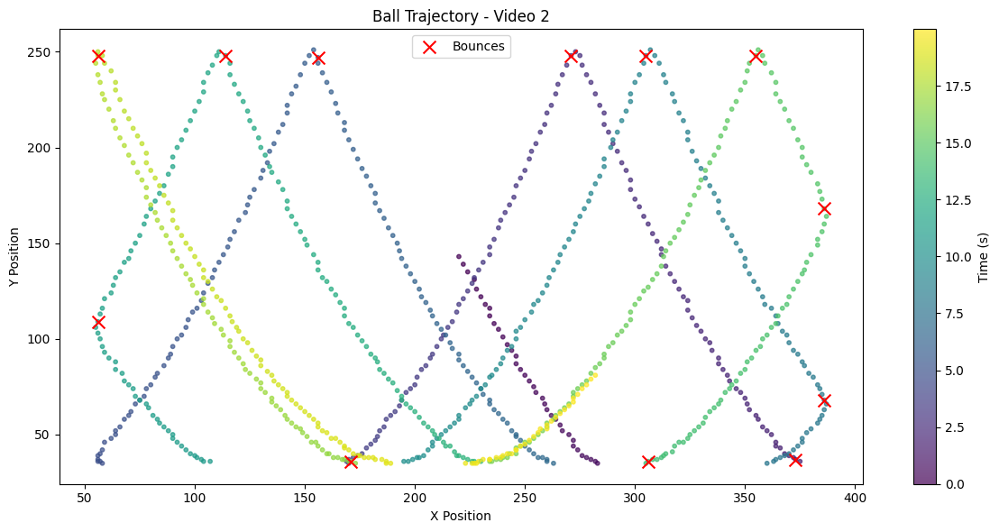

Processing video 20...


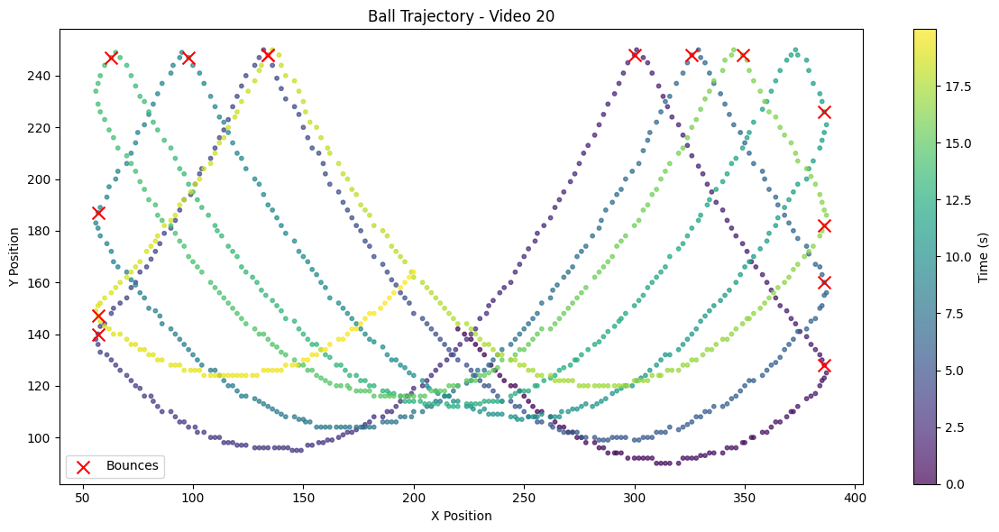

Processing video 21...


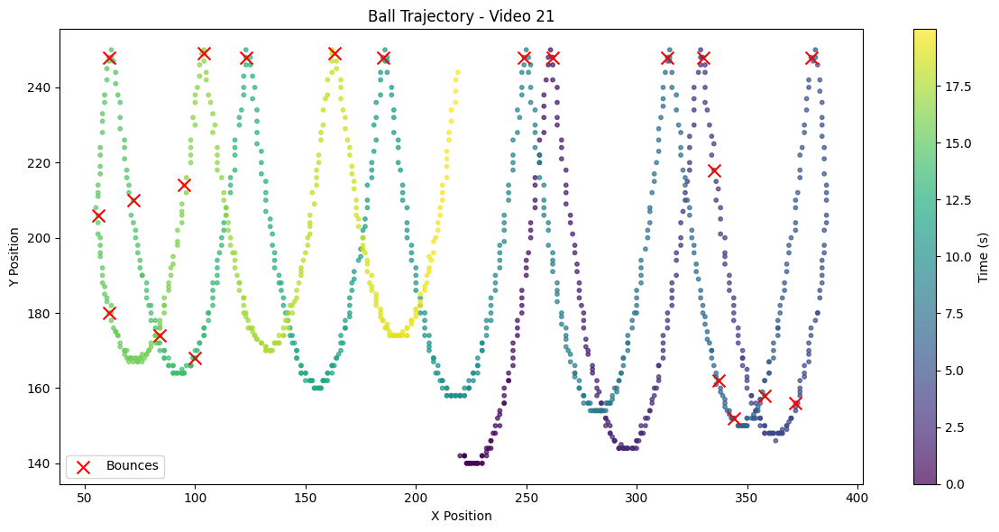

Processing video 22...


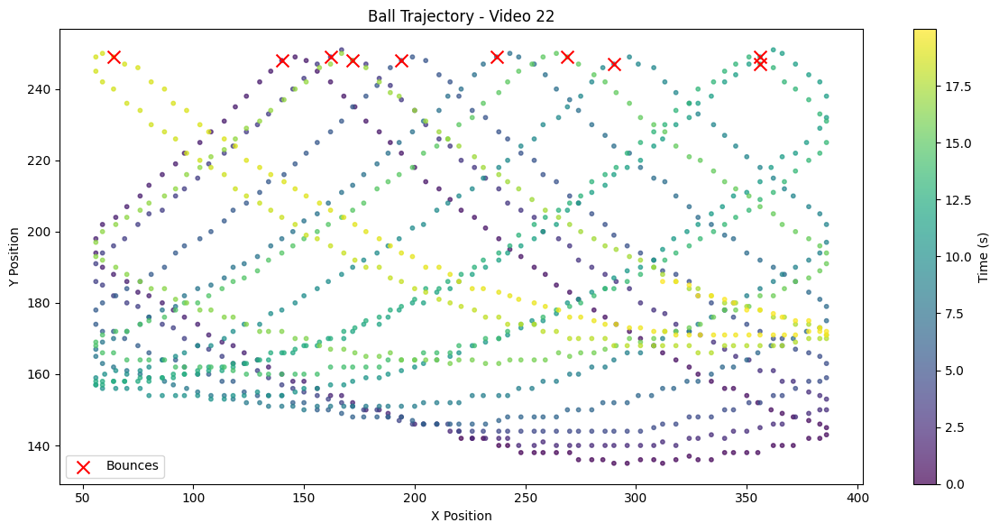

Processing video 23...


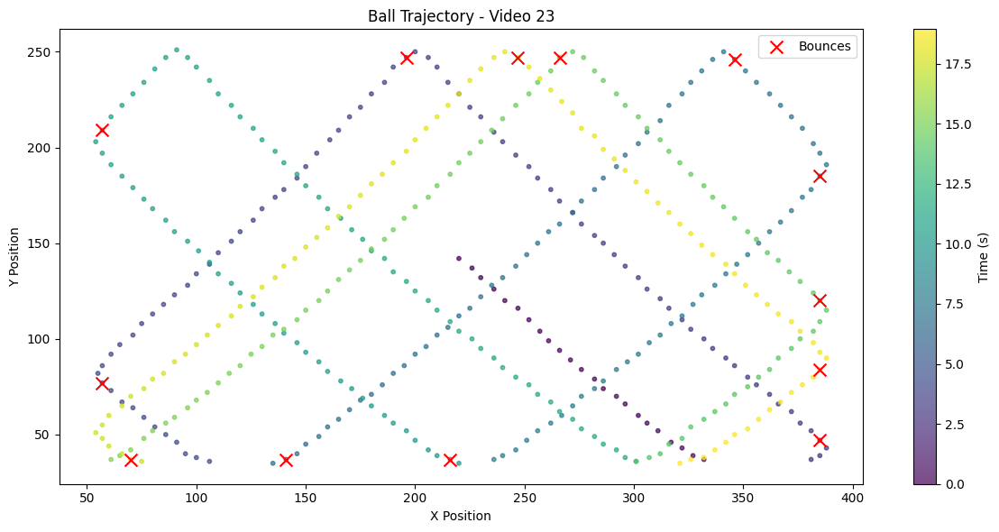

Processing video 24...


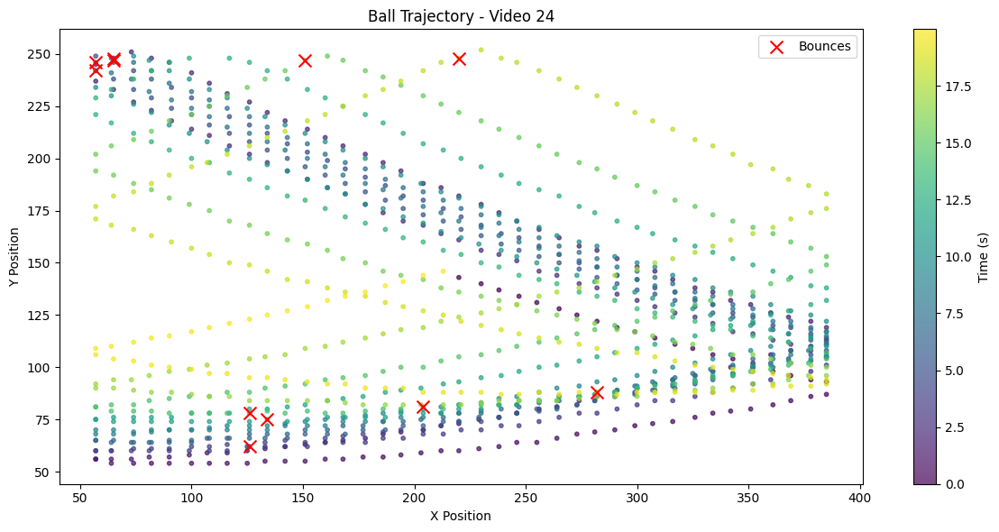

Processing video 25...


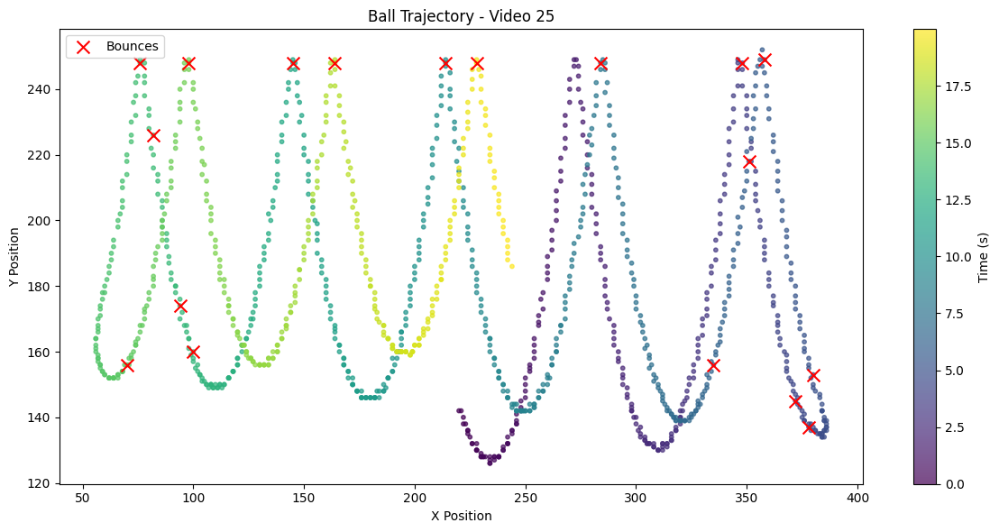

Processing video 26...


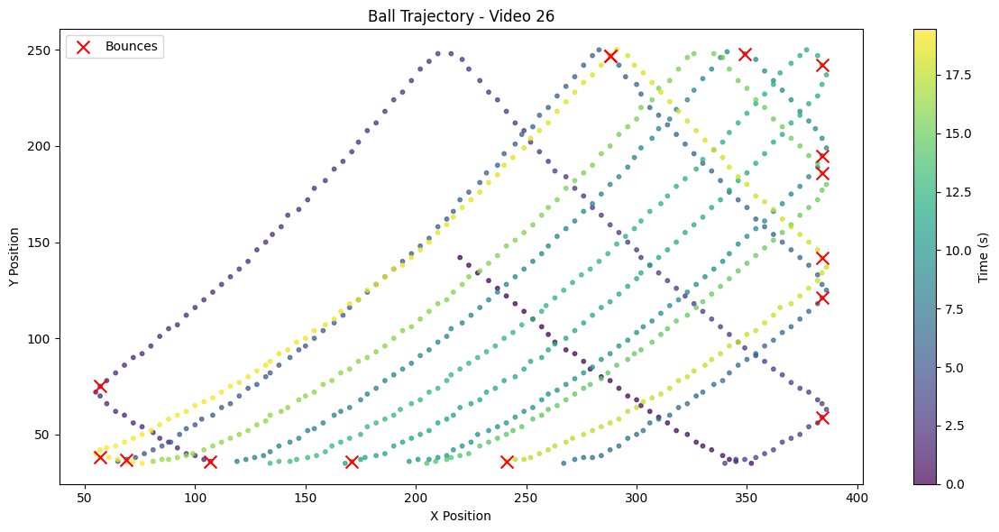

Processing video 27...


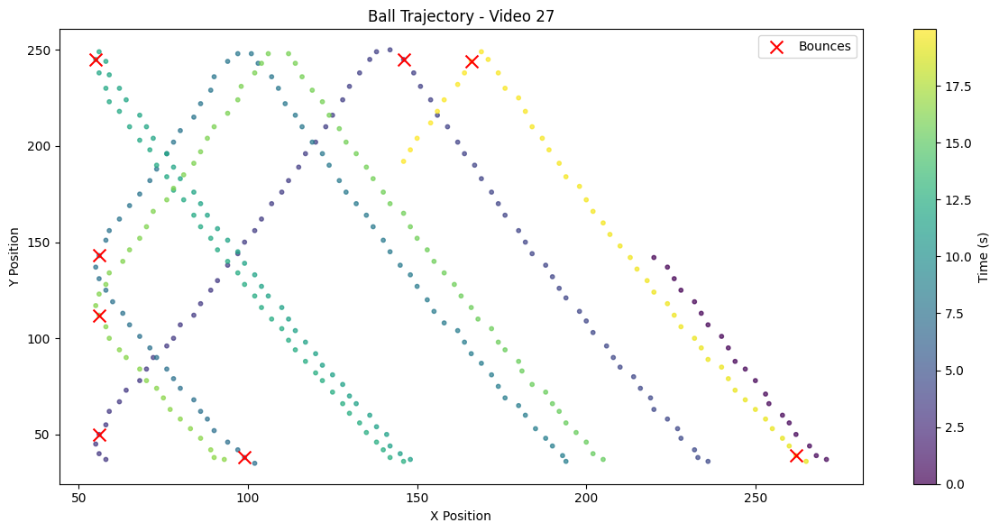

Processing video 28...


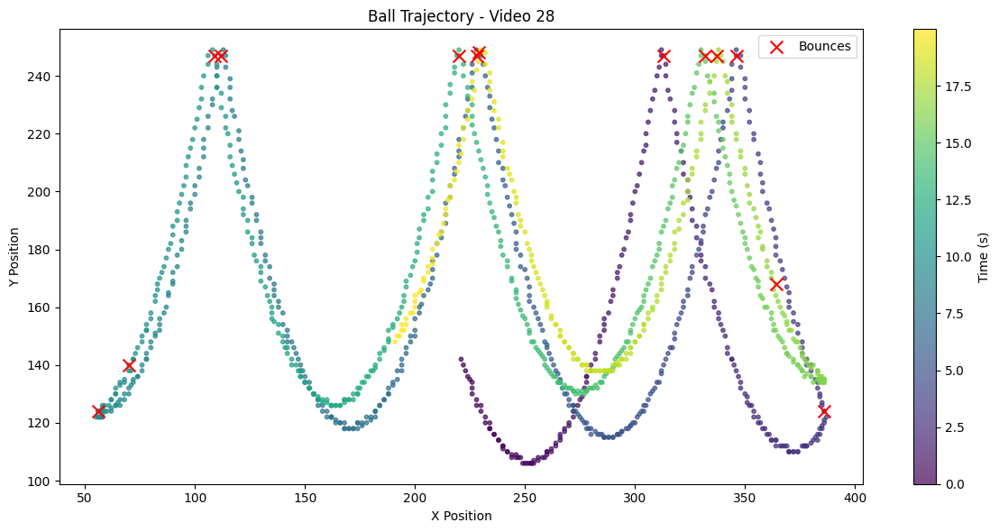

Processing video 29...


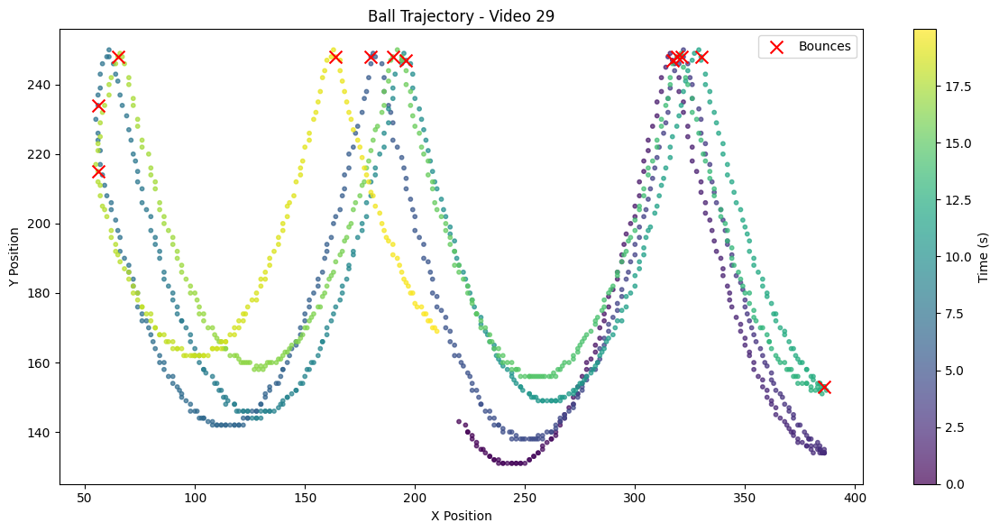

Processing video 3...


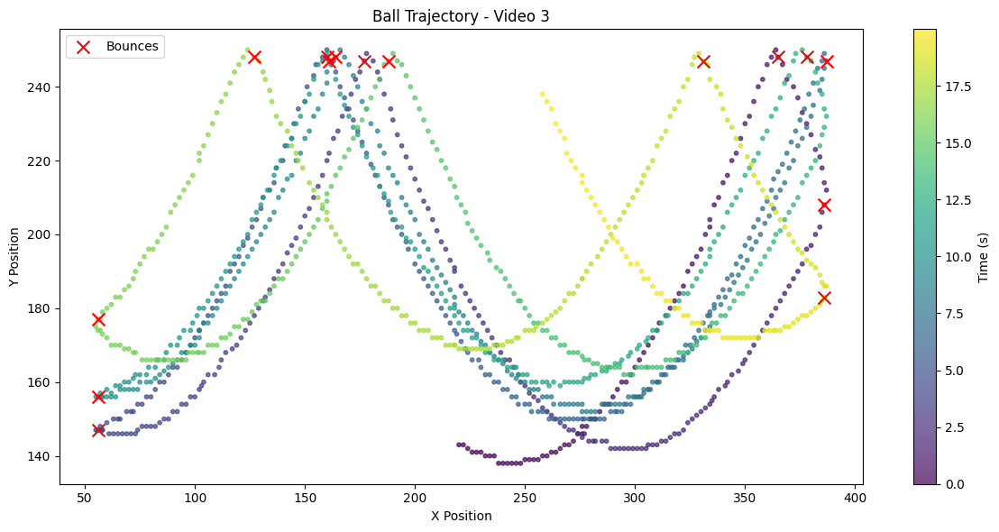

Processing video 30...


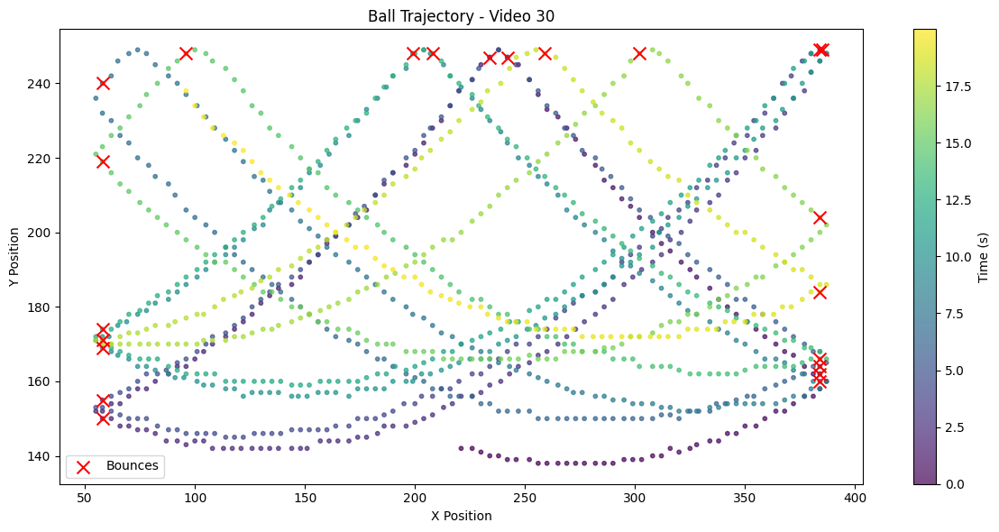

Processing video 31...


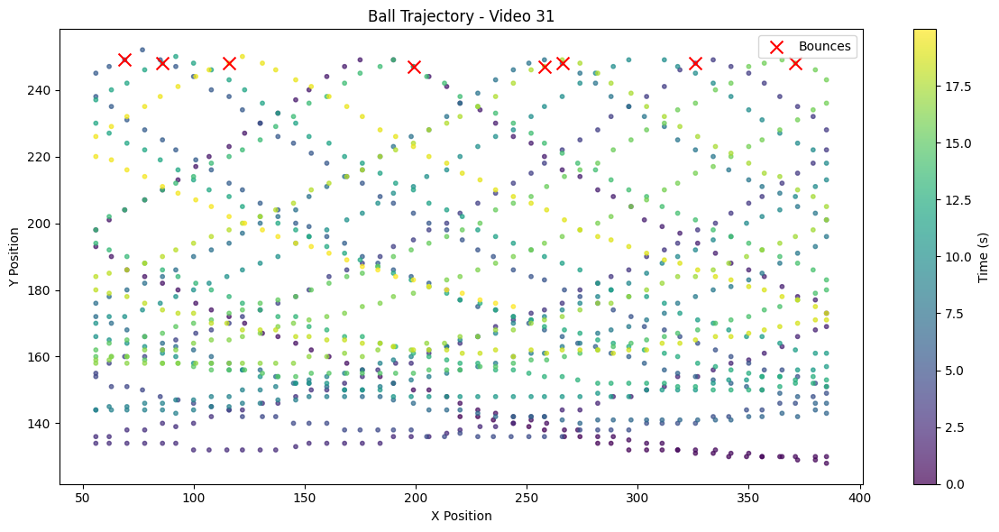

Processing video 32...


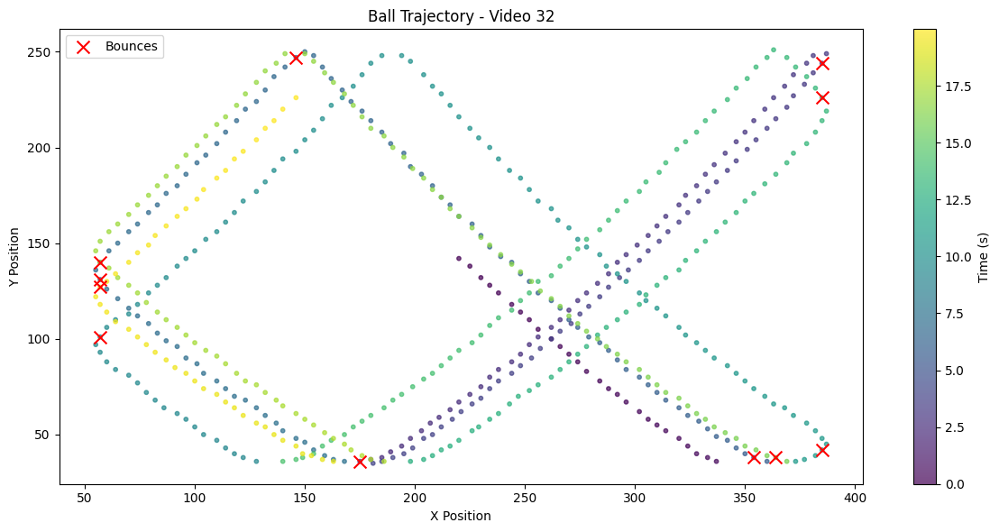

Processing video 33...


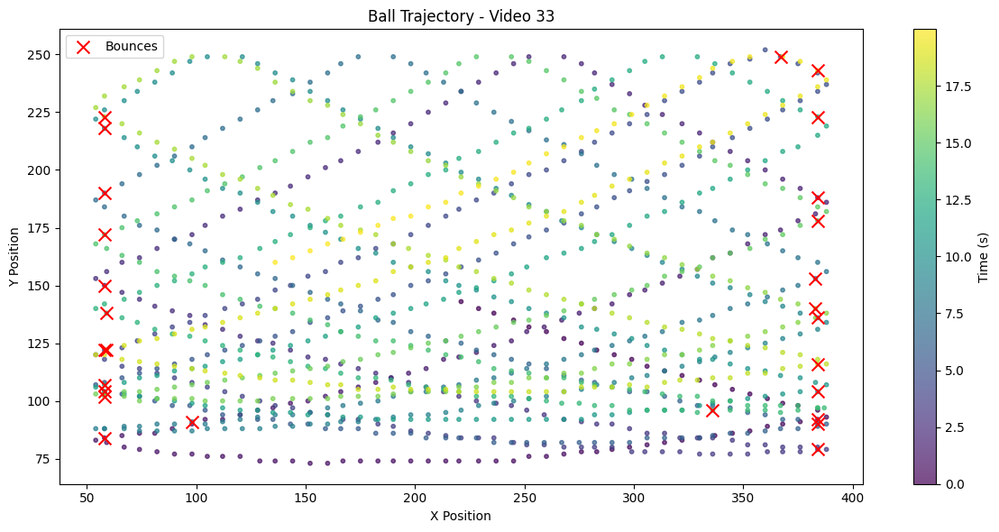

Processing video 34...


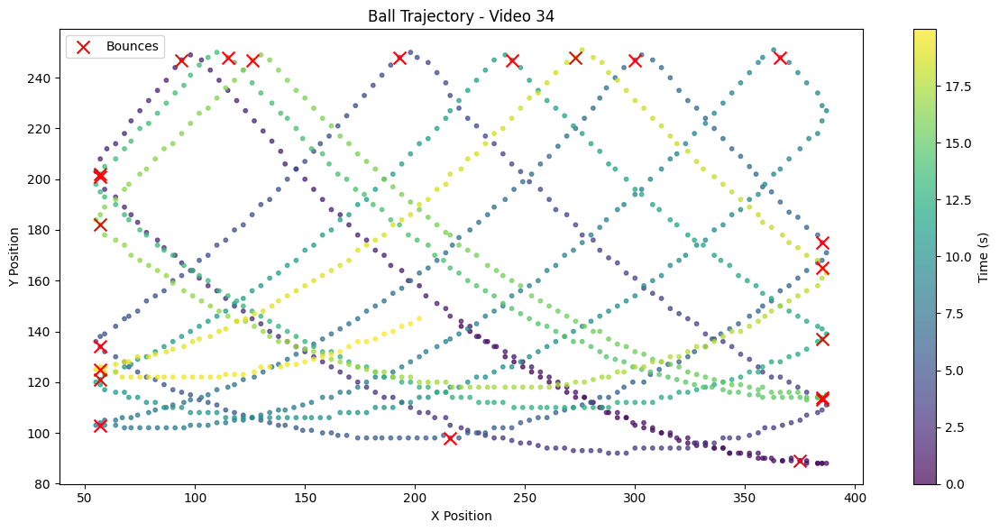

Processing video 35...


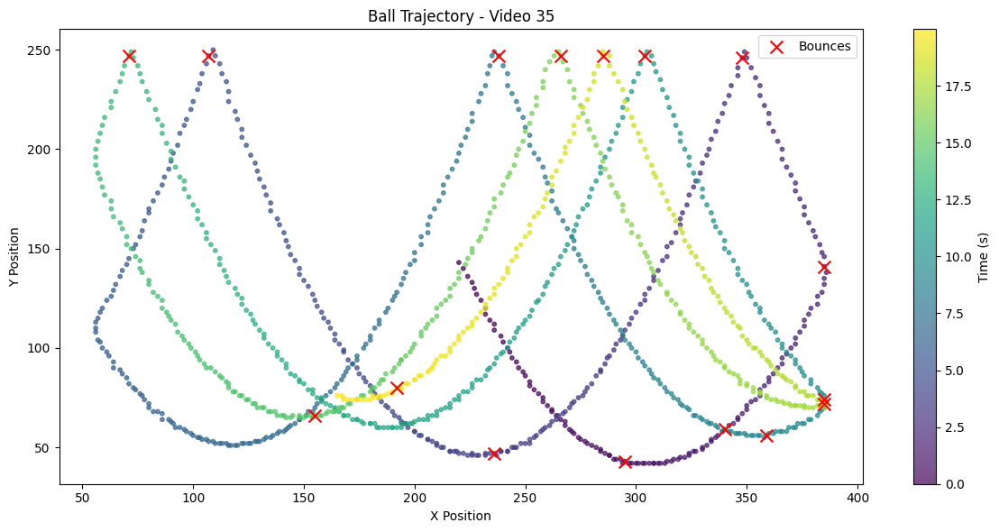

Processing video 36...


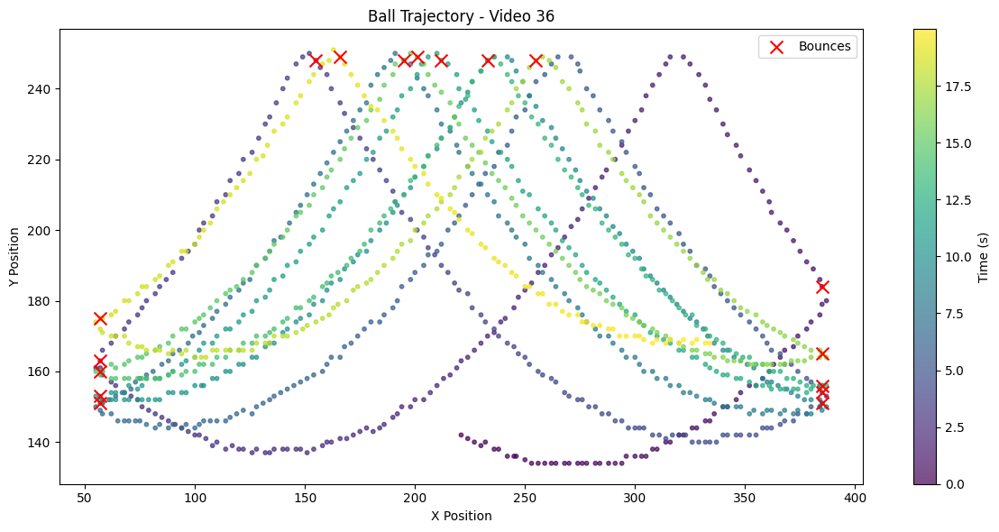

Processing video 37...


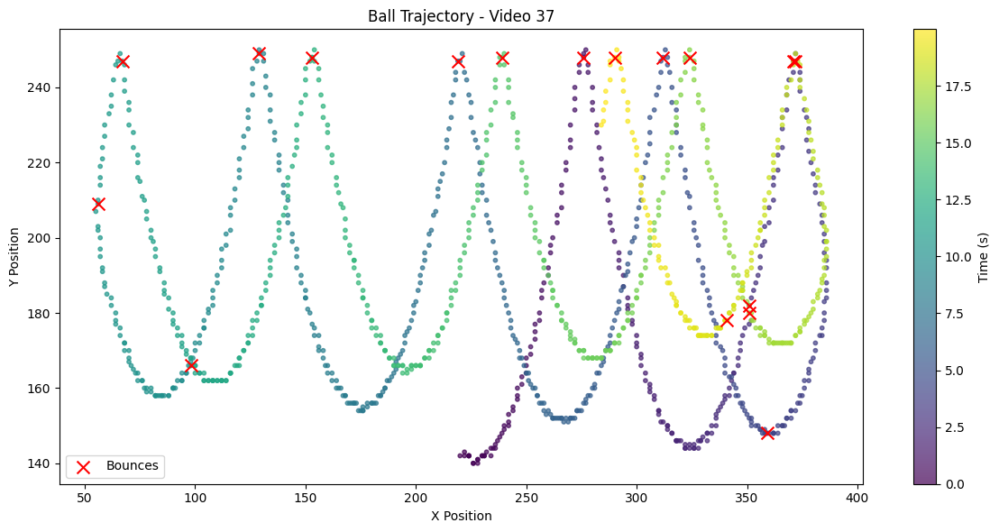

Processing video 38...


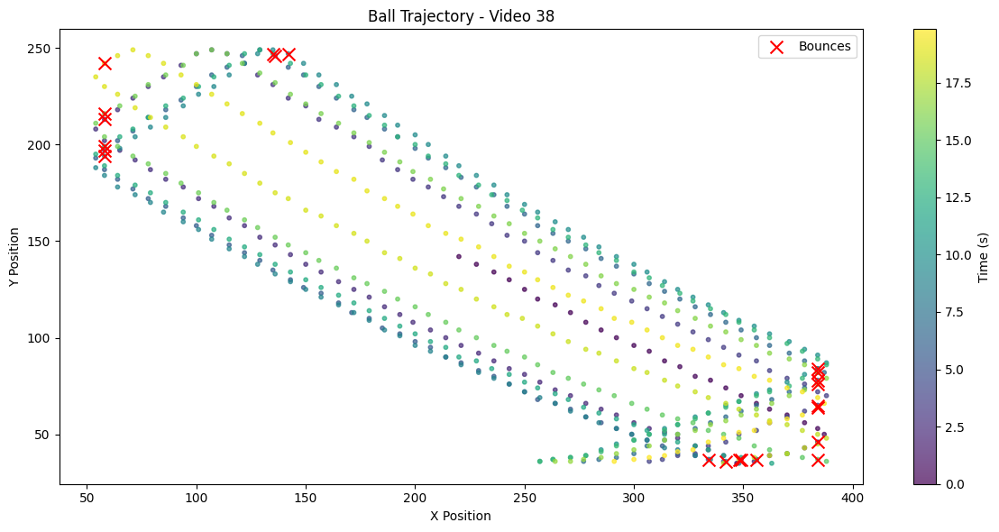

Processing video 39...


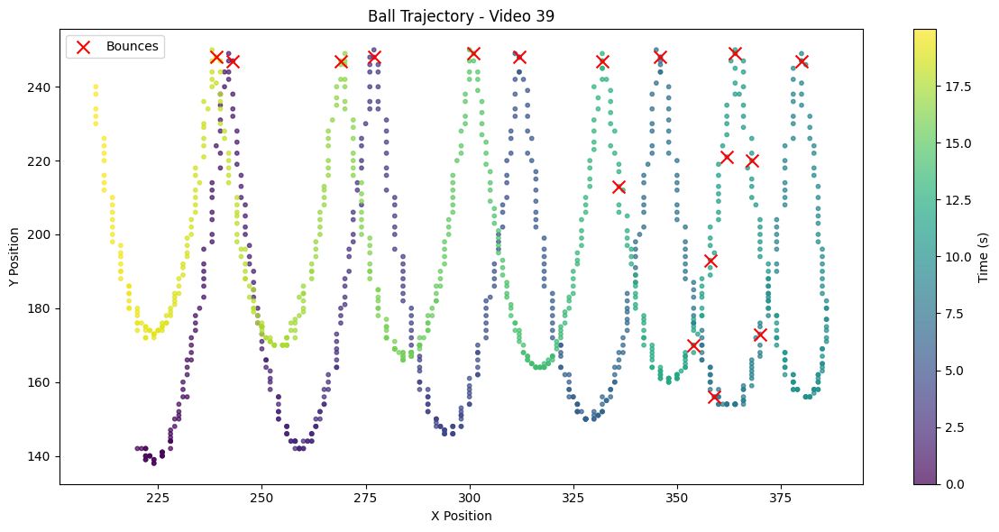

Processing video 4...


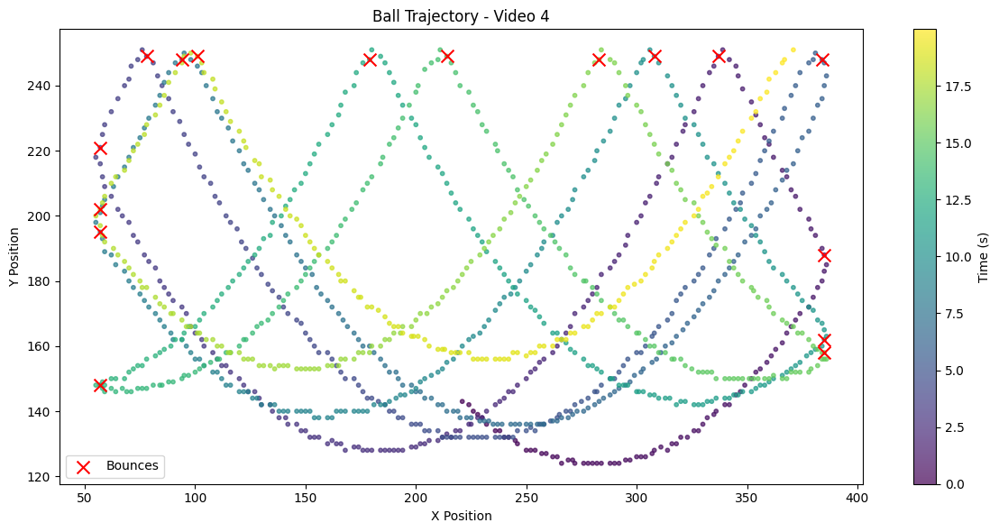

Processing video 40...


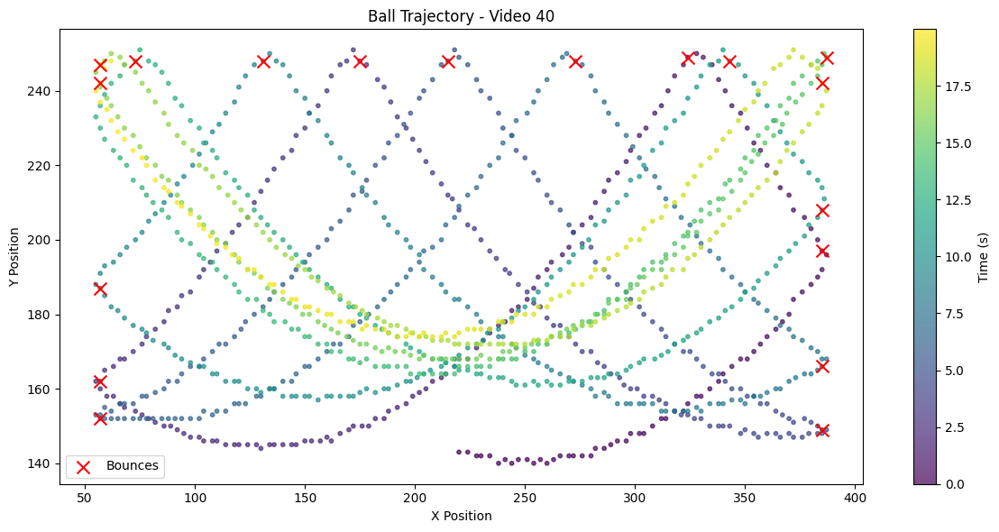

Processing video 41...


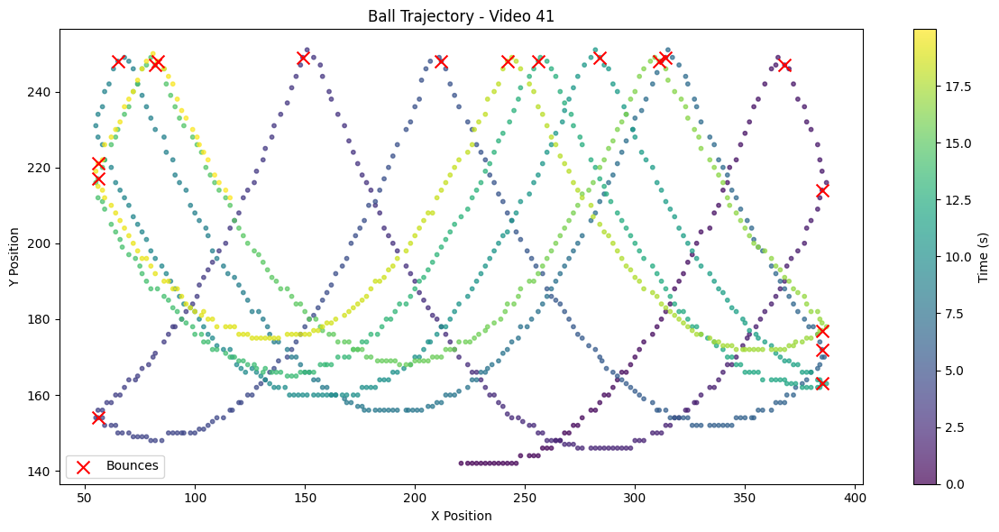

Processing video 42...


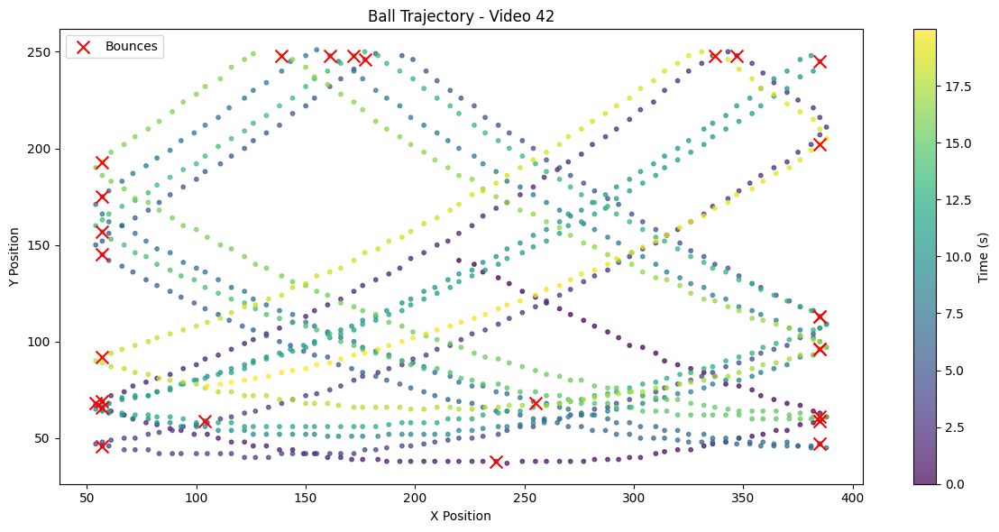

Processing video 43...


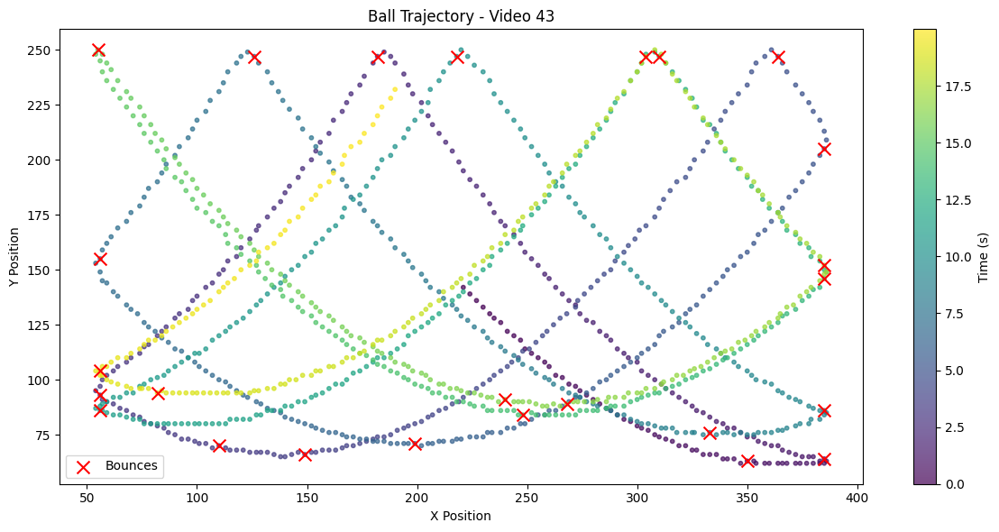

Processing video 44...


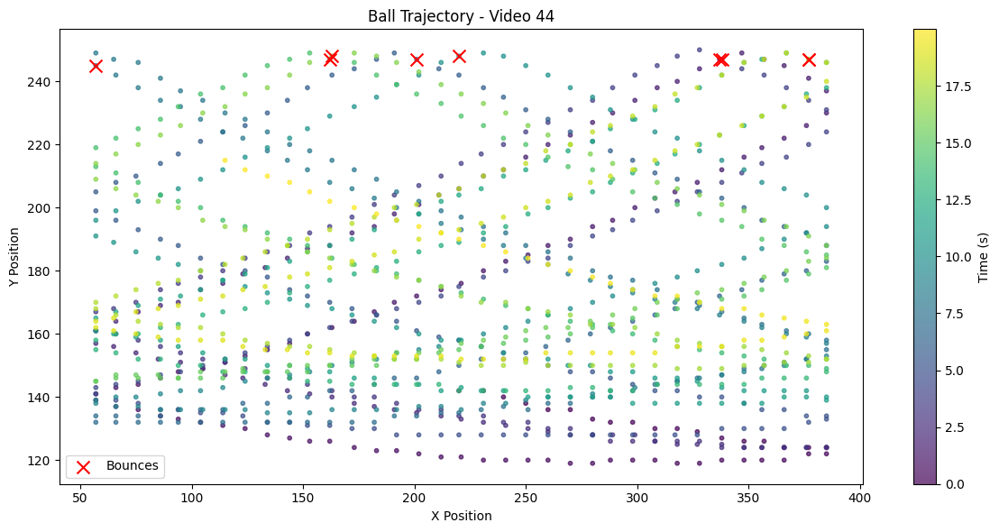

Processing video 45...


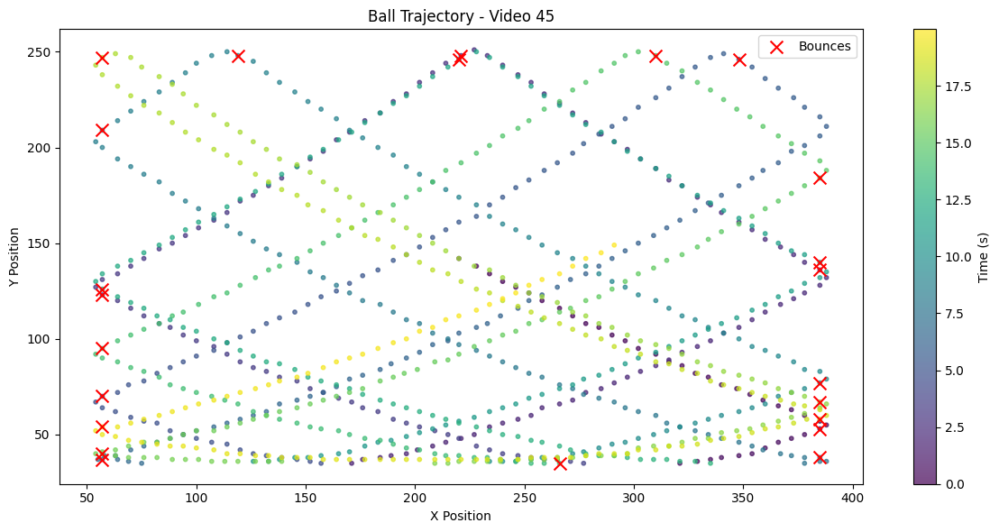

Processing video 5...


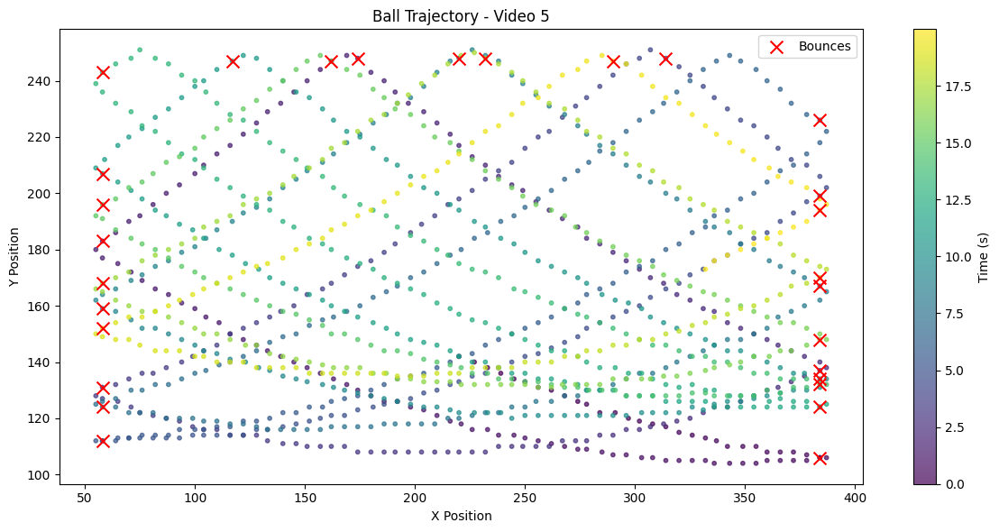

Processing video 6...


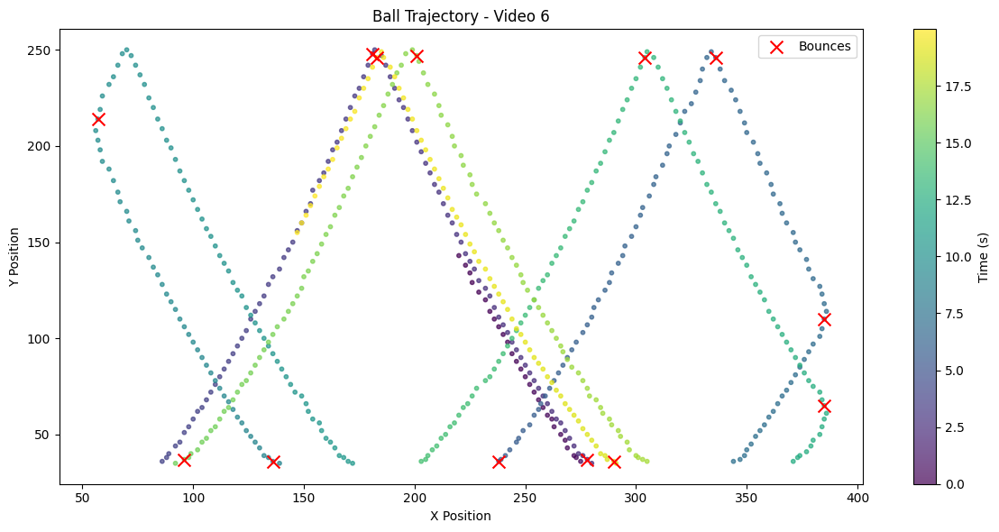

Processing video 7...


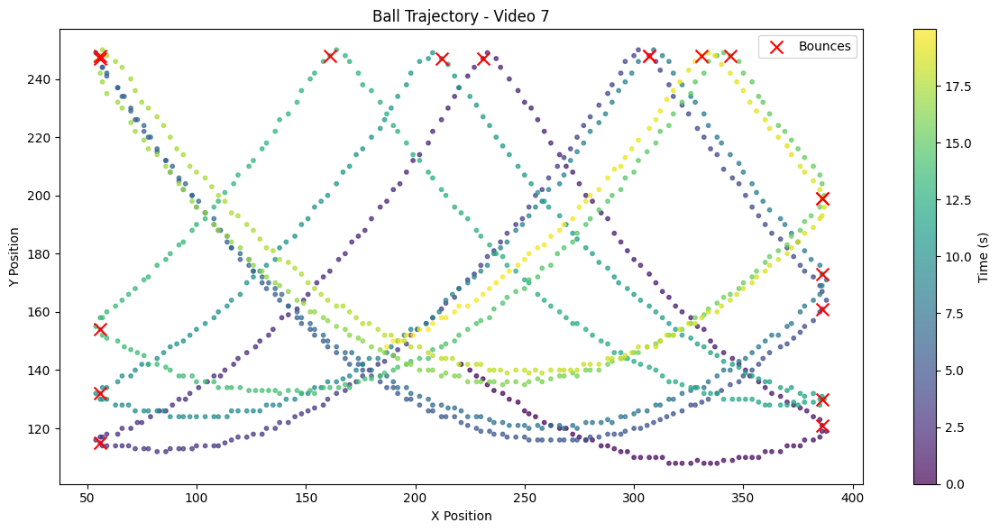

Processing video 8...


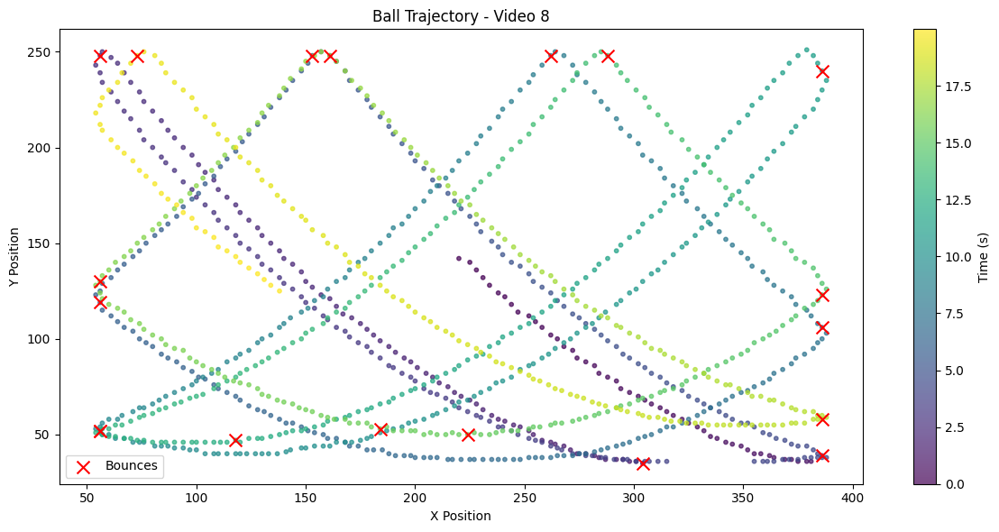

Processing video 9...


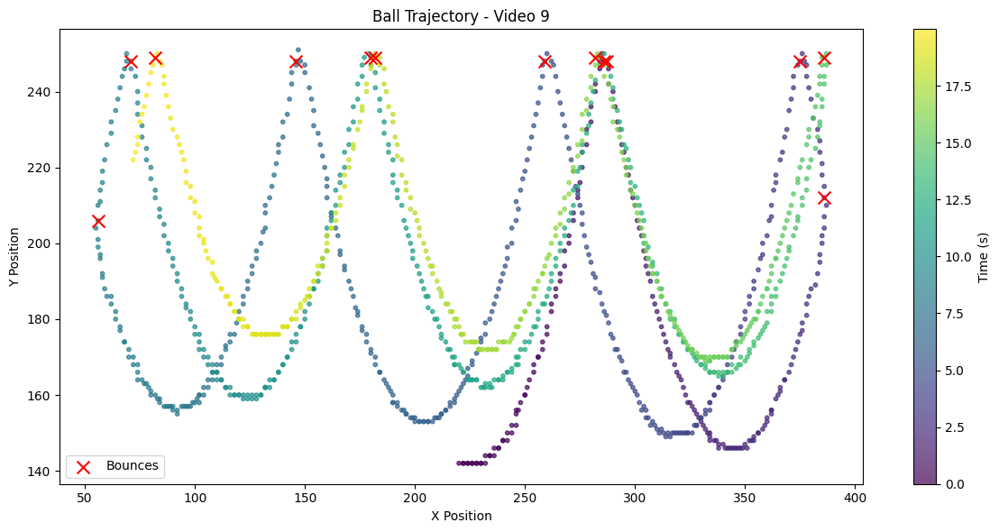

In [44]:
video_dir = '/kaggle/input/ball-bouncing-dataset/video_only'
video_bounces = {}

for video_file in sorted(os.listdir(video_dir)):
    if video_file.endswith('.mp4'):
        video_id = os.path.basename(video_file).split('_')[-1].split('.')[0]
        video_path = os.path.join(video_dir, video_file)
        
        cap = cv2.VideoCapture(video_path)
        fps = cap.get(cv2.CAP_PROP_FPS)
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        
        positions = []
        frame_idx = 0
        
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            ball_pos = detect_ball(frame)
            if ball_pos:
                positions.append((frame_idx / fps, ball_pos))
            frame_idx += 1
        
        cap.release()
        
        bounces = refine_video_bounces(
            positions,
            width,
            height,
            wall_threshold=100,
            min_time_between_bounces=0.15,
            velocity_threshold=15
        )
        
        video_bounces[video_id] = bounces
        
        # Visualizing trajectory and bounces for the current video
        print(f"Processing video {video_id}...")
        visualize_ball_trajectory_and_bounces(video_id, positions, bounces)


# Matching

## Here we will match the audio and video files

In [75]:
from scipy.spatial.distance import cdist

def match_audio_to_video(audio_impacts, video_bounces):
    """Match each audio file to its best-matching video file."""
    matches = []
    used_videos = set()
    
    for audio_id, audio_times in audio_impacts.items():
        best_match = None
        best_score = float('inf')
        
        for video_id, video_times in video_bounces.items():
            if video_id in used_videos:  # Ensure one-to-one relationship
                continue
            
            # Reshape impulse times into 2D arrays
            audio_times_reshaped = np.array(audio_times).reshape(-1, 1)
            video_times_reshaped = np.array(video_times).reshape(-1, 1)
            
            # Compute distance between impulses
            distance_matrix = cdist(audio_times_reshaped, video_times_reshaped, metric='euclidean')
            
            # Sum of minimum distances (best alignment)
            distance_score = np.sum(np.min(distance_matrix, axis=0))
            
            if distance_score < best_score:
                best_score = distance_score
                best_match = video_id
        
        if best_match is not None:
            matches.append((f"audio_only_ID_{audio_id}", f"video_only_ID_{best_match}"))
            used_videos.add(best_match)  # Mark this video as matched
    
    return matches

# Example usage:
matches = match_audio_to_video(audio_impacts, video_bounces)

# Save matches to CSV
import pandas as pd

def save_matches_to_csv(matches, output_csv_path):
    df = pd.DataFrame(matches, columns=['audio', 'video'])
    df.to_csv(output_csv_path, index=False)

output_csv_path = 'submit_solution_mapping3.csv'
save_matches_to_csv(matches, output_csv_path)

print("Matching complete! Results saved to submit_solution_mapping.csv")


Matching complete! Results saved to submit_solution_mapping.csv


# Visualizing the matches

Visualizing match: Audio ID 1 vs Video ID 2


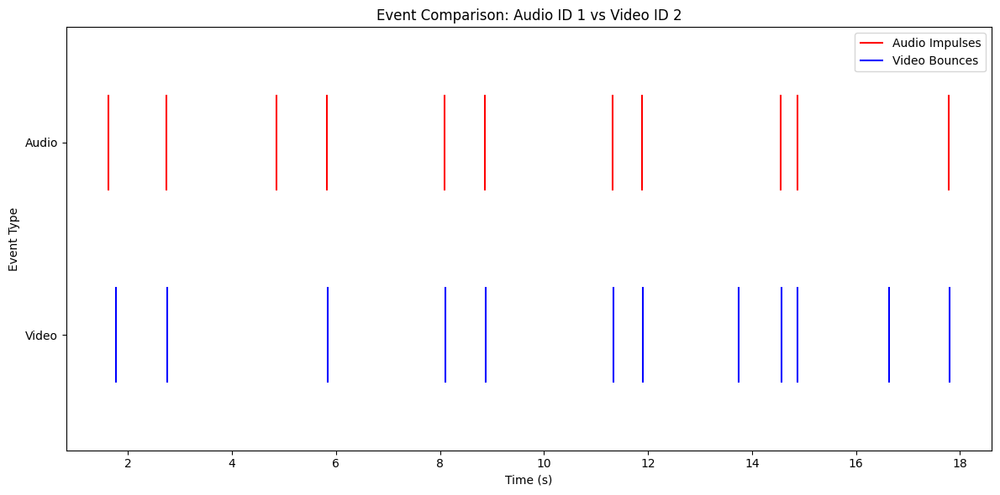

Visualizing match: Audio ID 10 vs Video ID 31


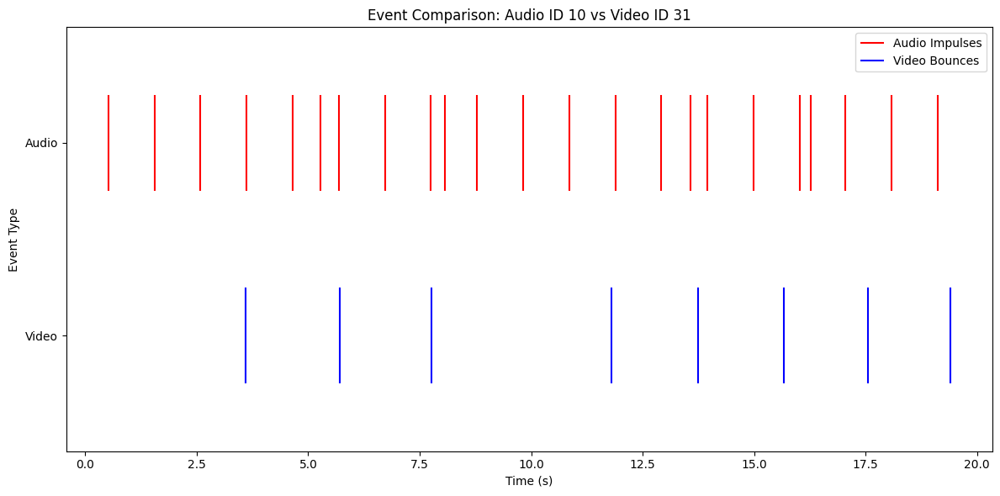

Visualizing match: Audio ID 11 vs Video ID 24


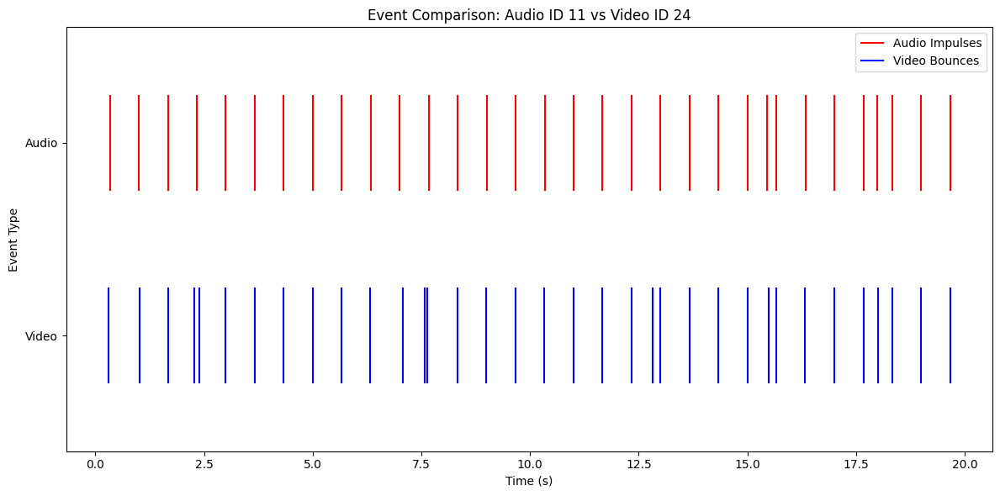

Visualizing match: Audio ID 12 vs Video ID 28


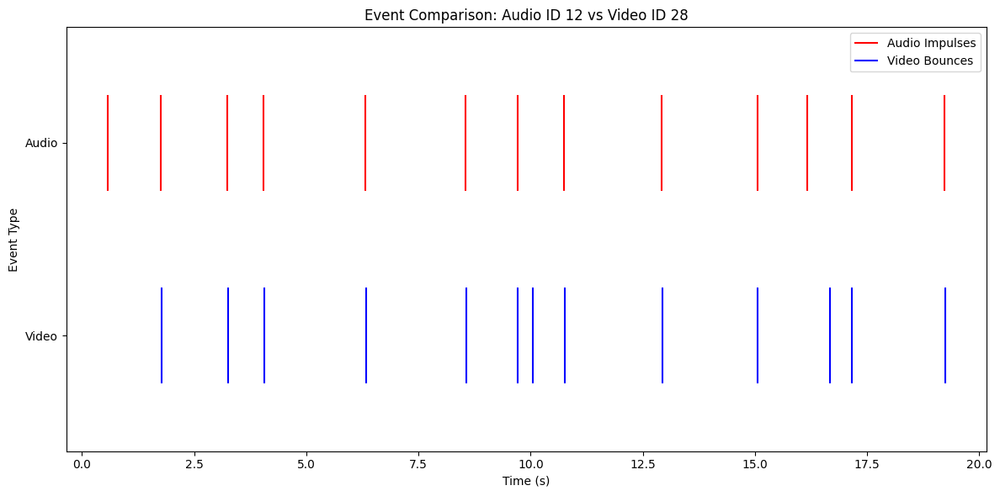

Visualizing match: Audio ID 13 vs Video ID 14


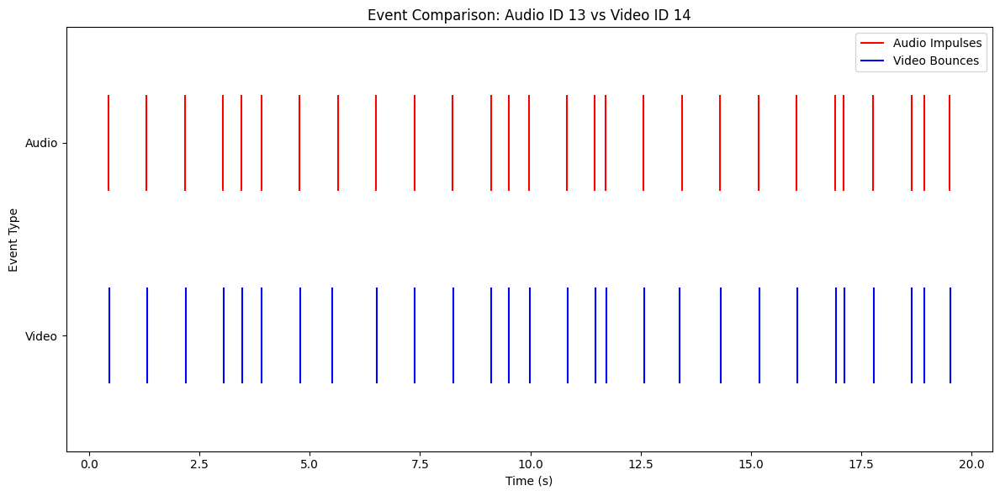

Visualizing match: Audio ID 14 vs Video ID 7


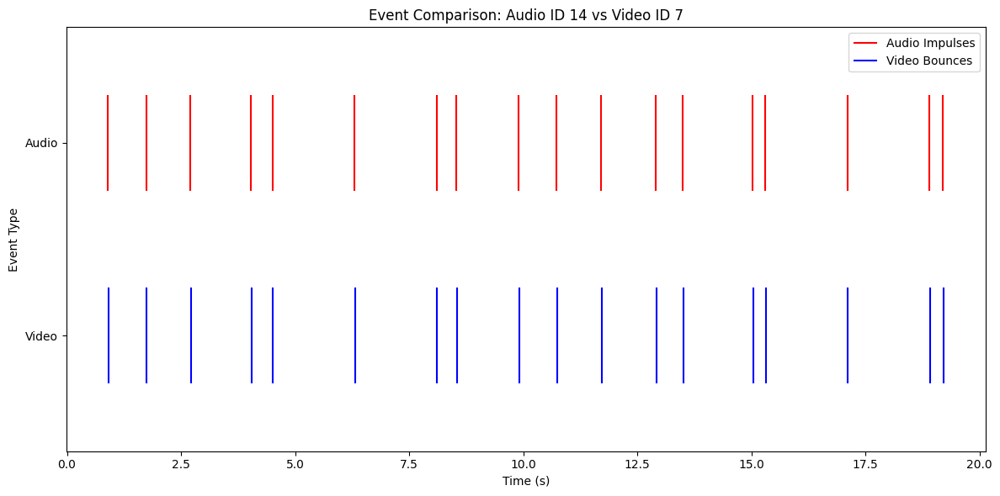

Visualizing match: Audio ID 15 vs Video ID 38


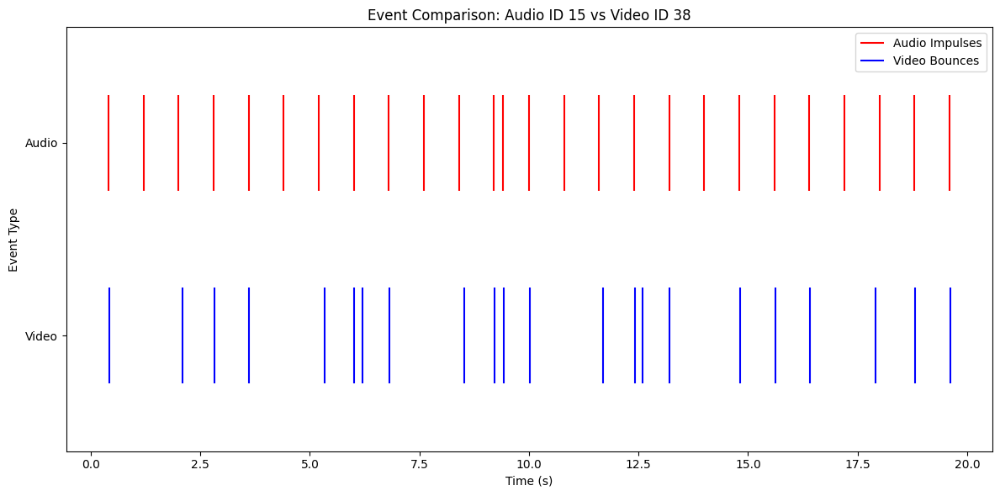

Visualizing match: Audio ID 16 vs Video ID 12


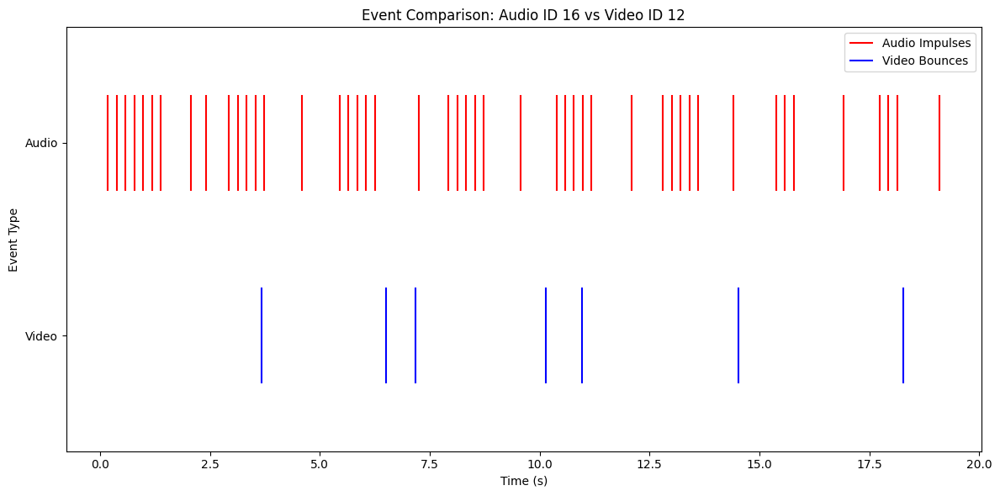

Visualizing match: Audio ID 17 vs Video ID 34


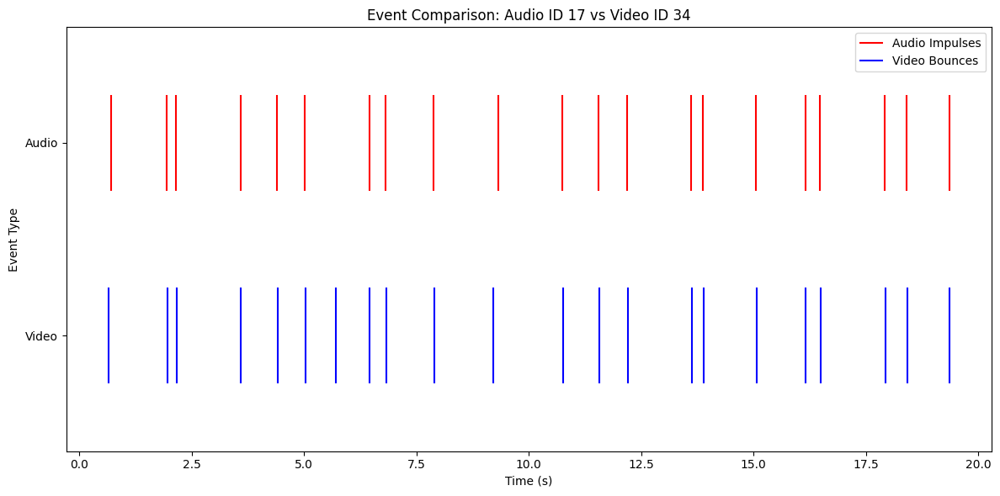

Visualizing match: Audio ID 18 vs Video ID 4


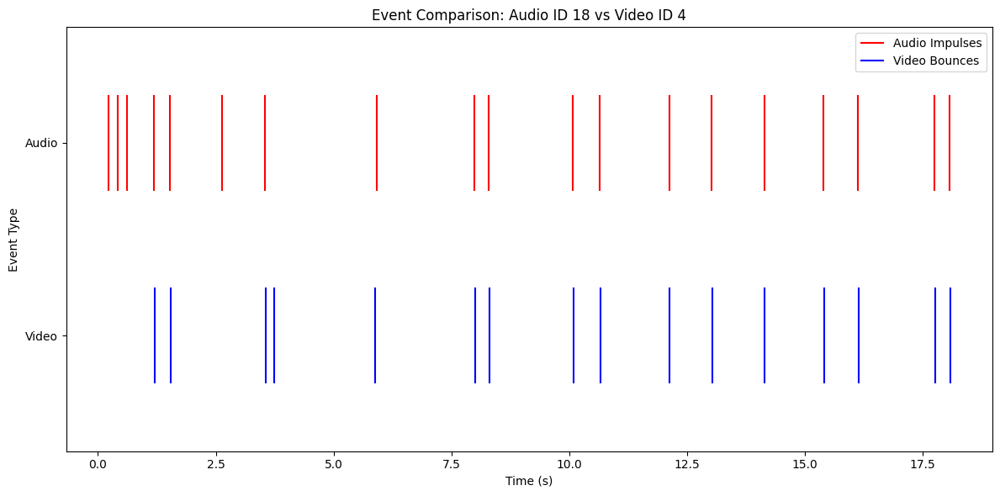

Visualizing match: Audio ID 19 vs Video ID 5


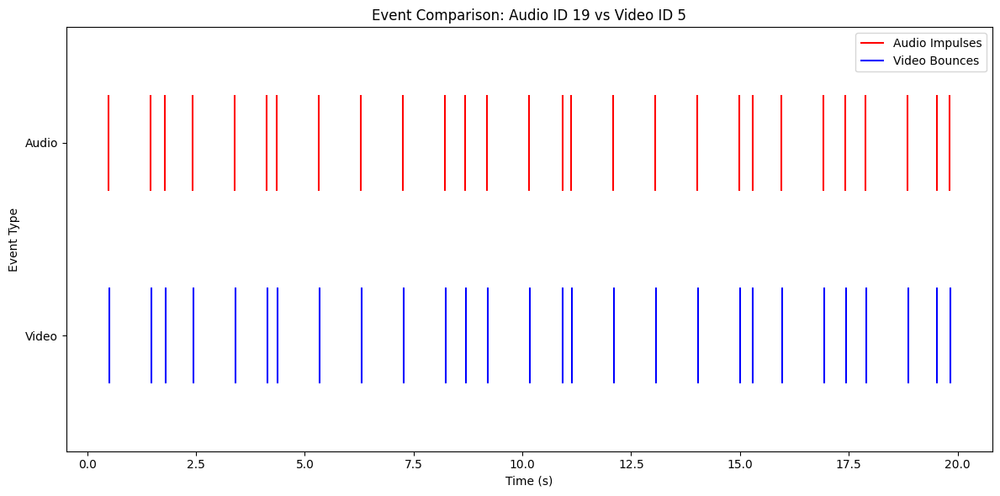

Visualizing match: Audio ID 2 vs Video ID 16


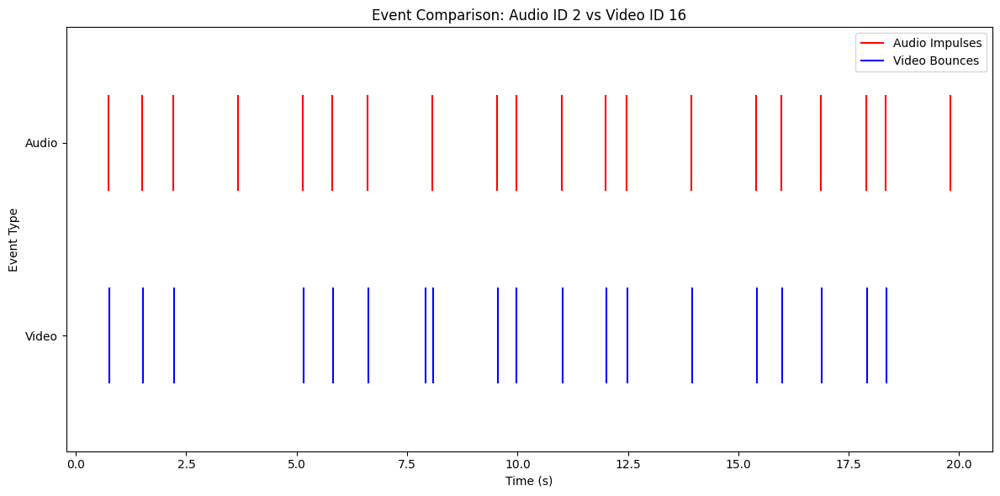

Visualizing match: Audio ID 20 vs Video ID 11


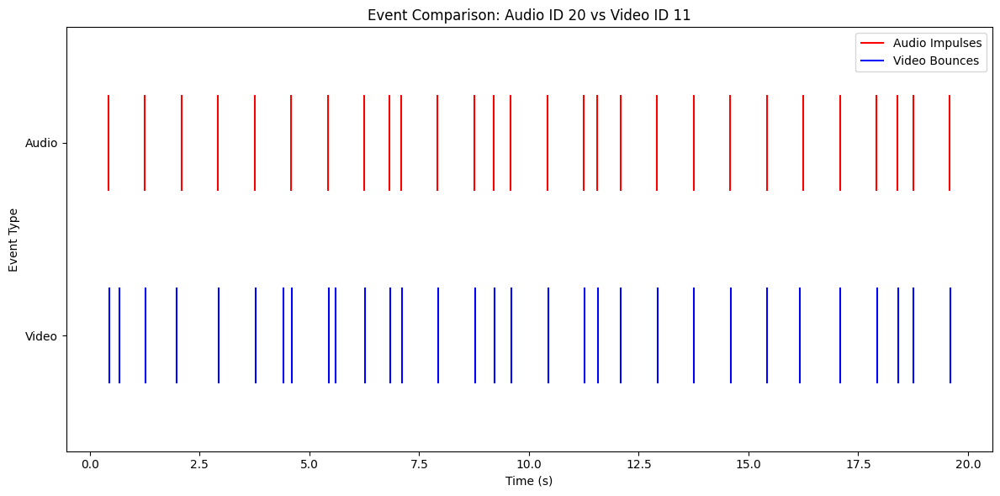

Visualizing match: Audio ID 21 vs Video ID 26


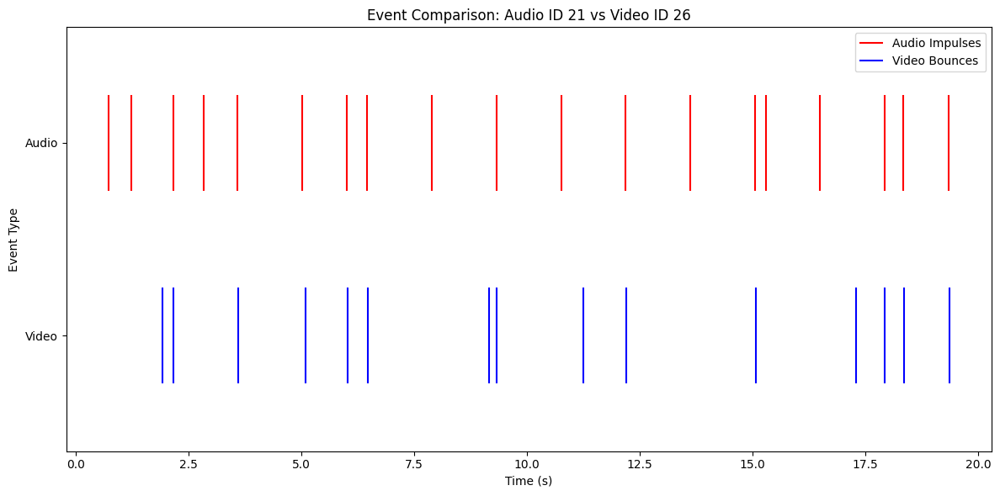

Visualizing match: Audio ID 22 vs Video ID 45


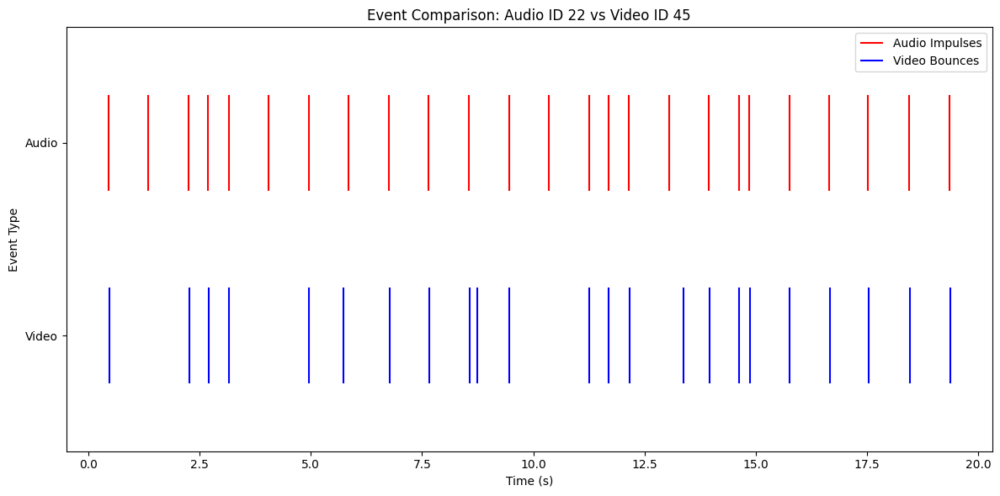

Visualizing match: Audio ID 23 vs Video ID 10


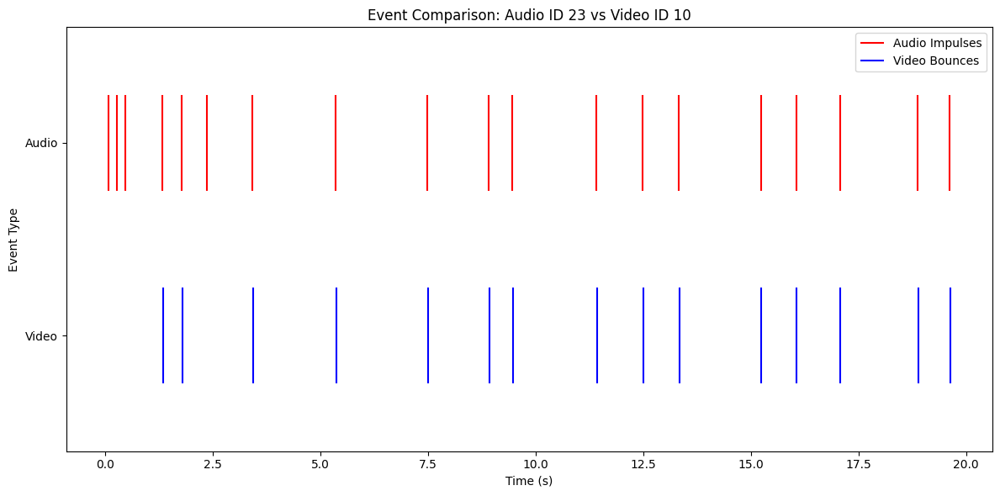

Visualizing match: Audio ID 24 vs Video ID 44


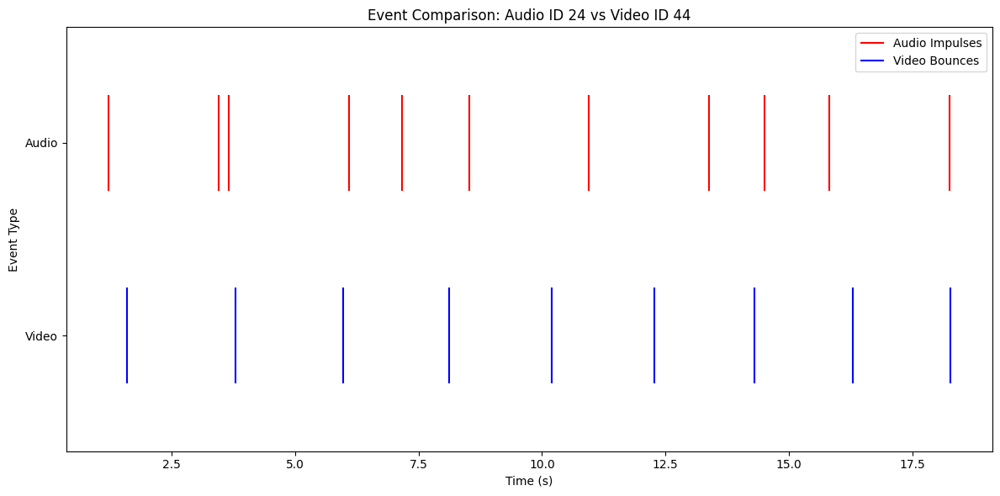

Visualizing match: Audio ID 25 vs Video ID 21


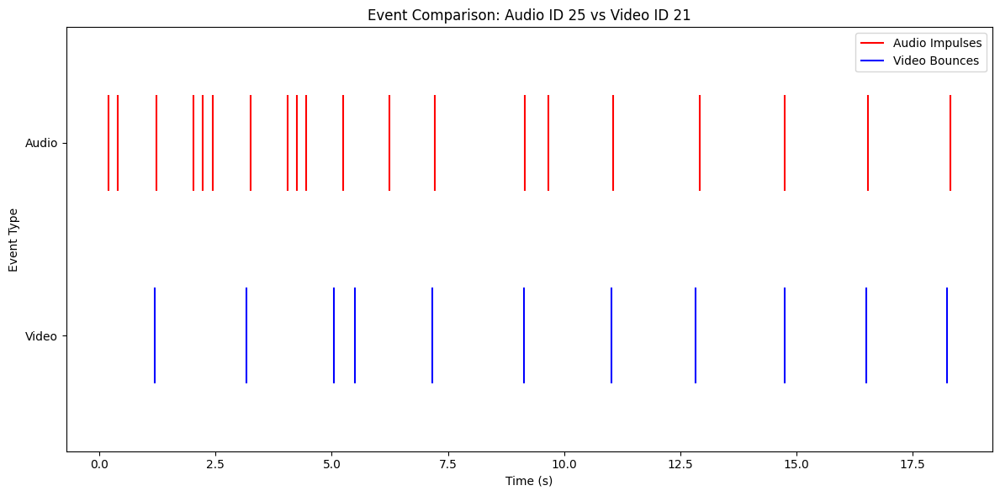

Visualizing match: Audio ID 26 vs Video ID 35


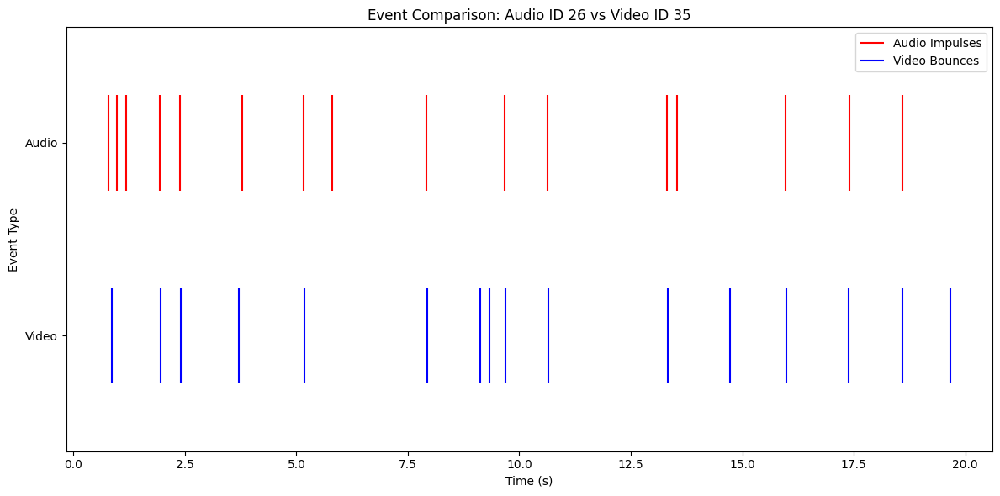

Visualizing match: Audio ID 27 vs Video ID 40


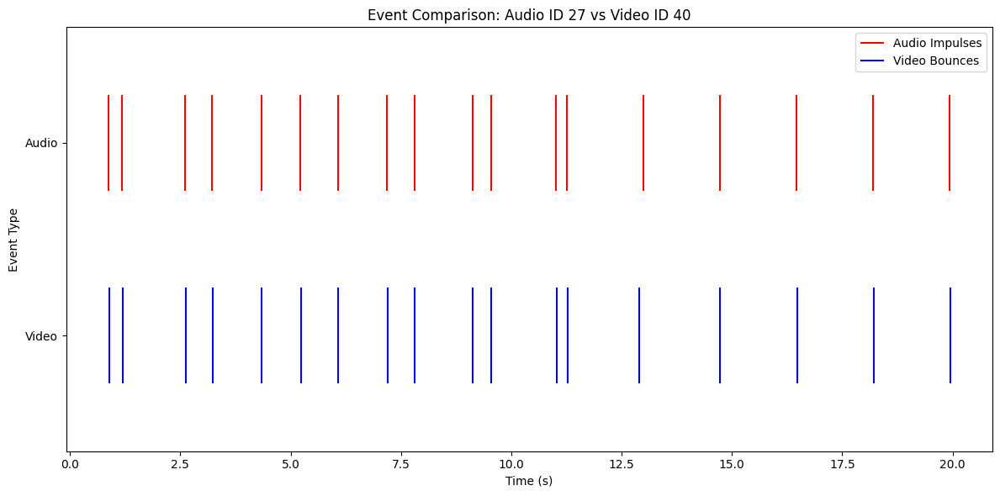

Visualizing match: Audio ID 28 vs Video ID 27


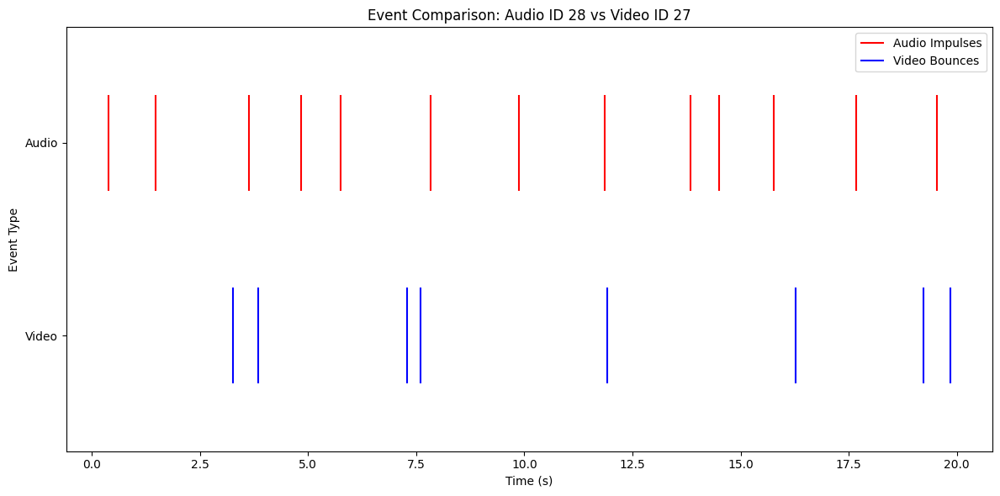

Visualizing match: Audio ID 29 vs Video ID 30


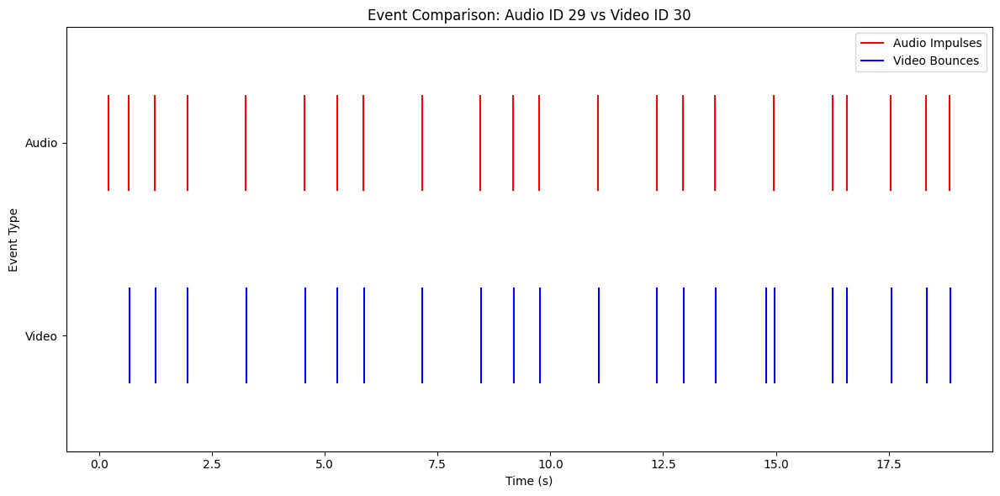

Visualizing match: Audio ID 3 vs Video ID 20


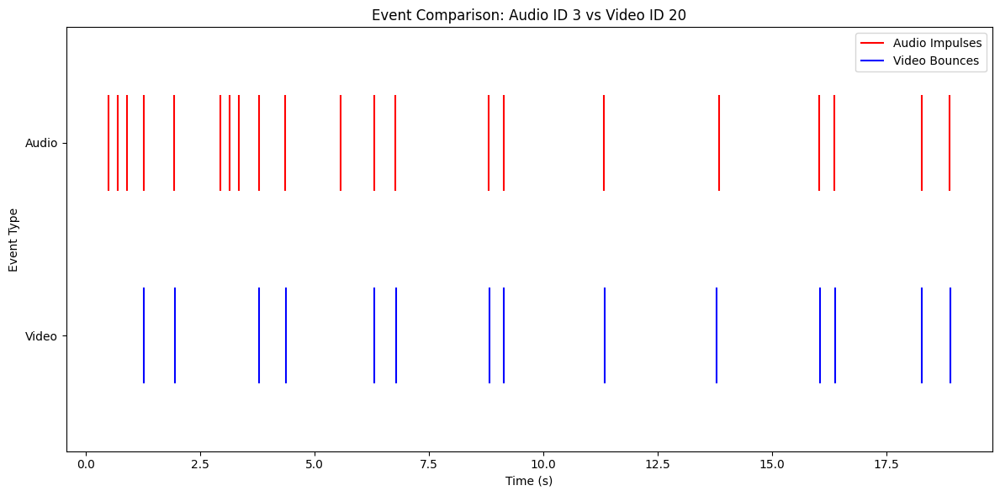

Visualizing match: Audio ID 30 vs Video ID 15


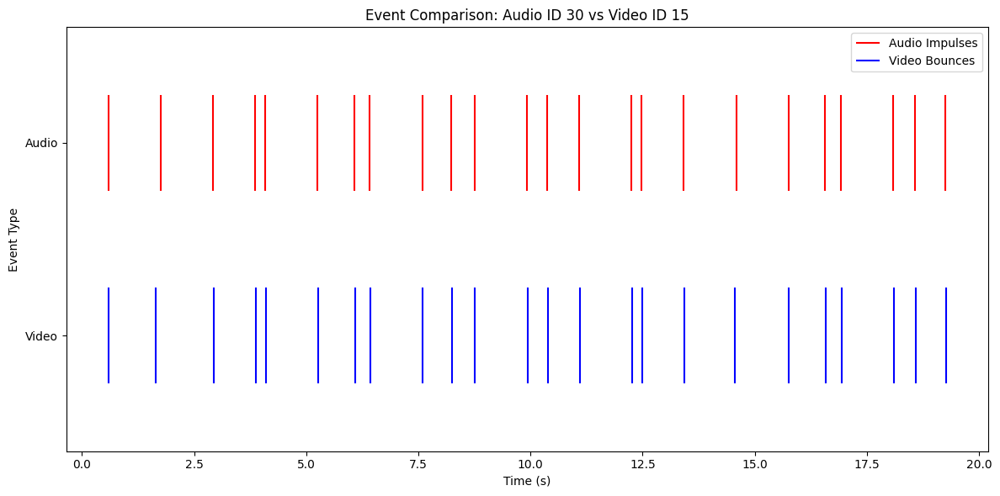

Visualizing match: Audio ID 31 vs Video ID 6


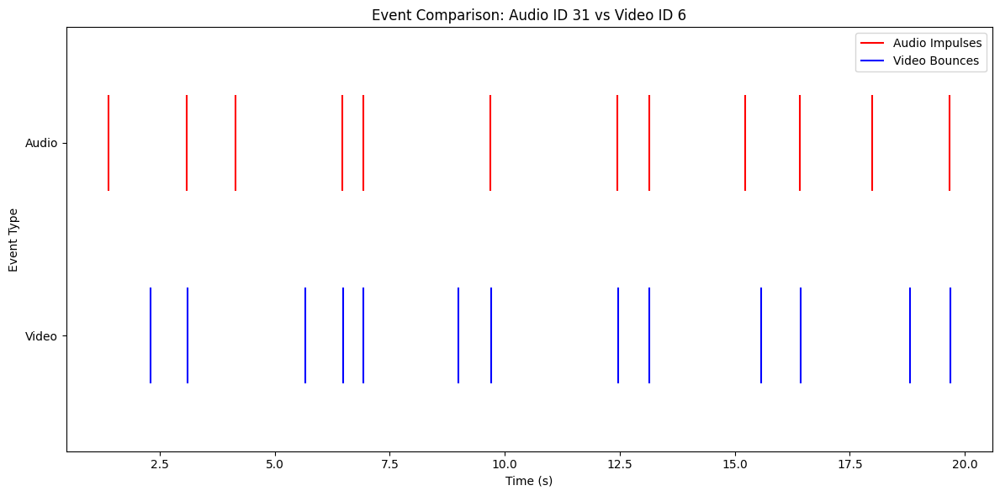

Visualizing match: Audio ID 32 vs Video ID 29


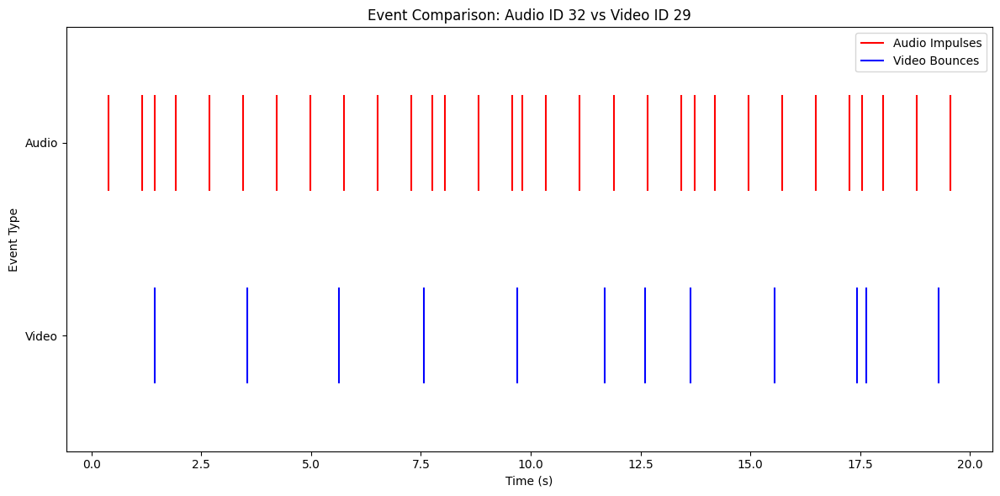

Visualizing match: Audio ID 33 vs Video ID 18


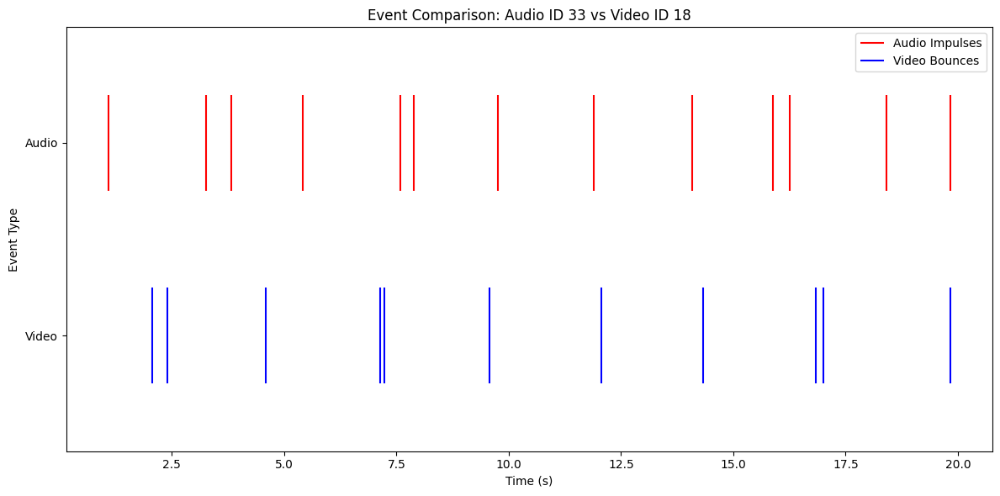

Visualizing match: Audio ID 34 vs Video ID 41


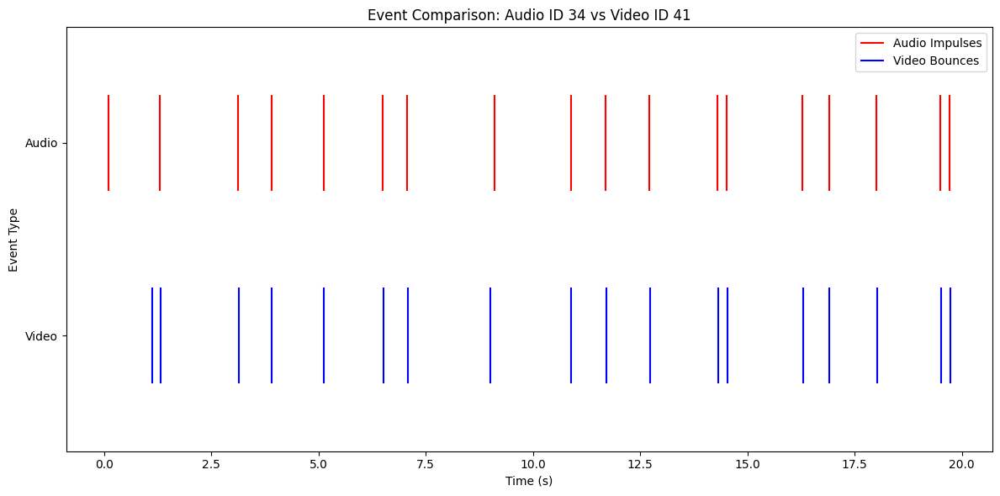

Visualizing match: Audio ID 35 vs Video ID 9


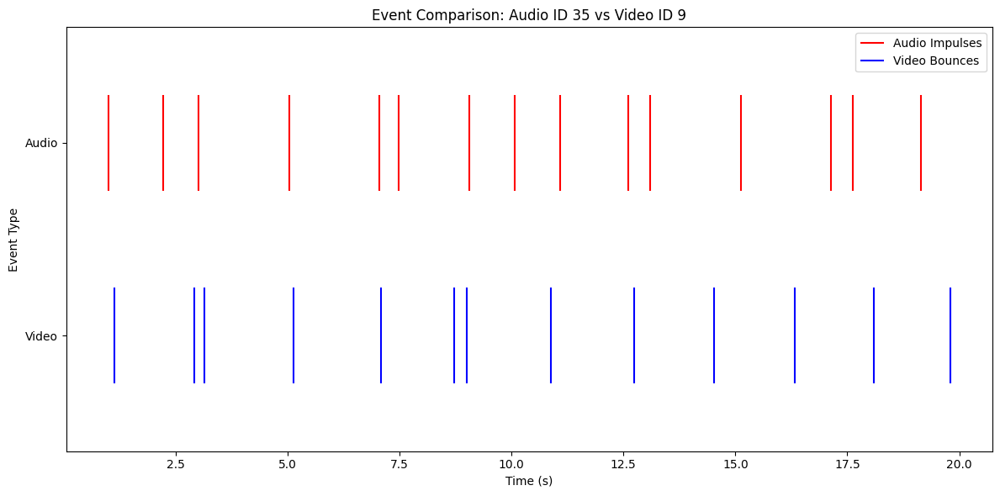

Visualizing match: Audio ID 36 vs Video ID 3


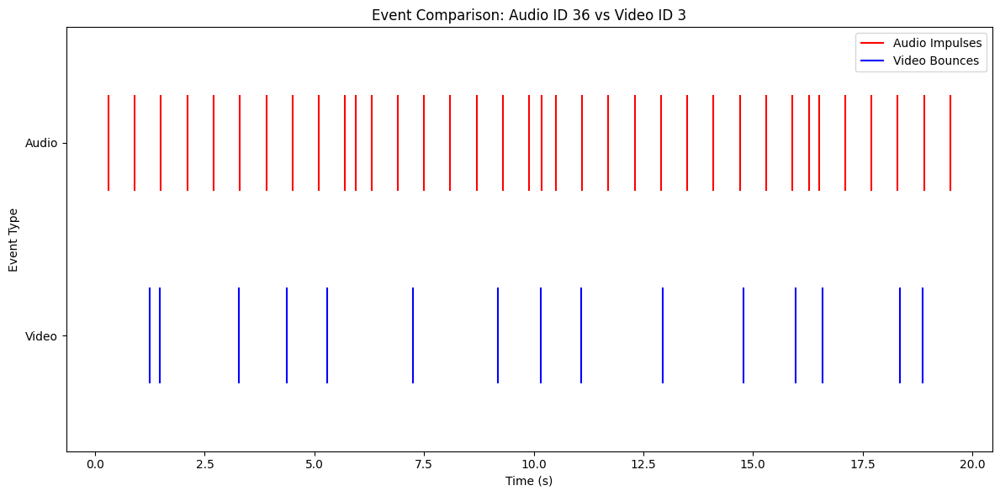

Visualizing match: Audio ID 37 vs Video ID 32


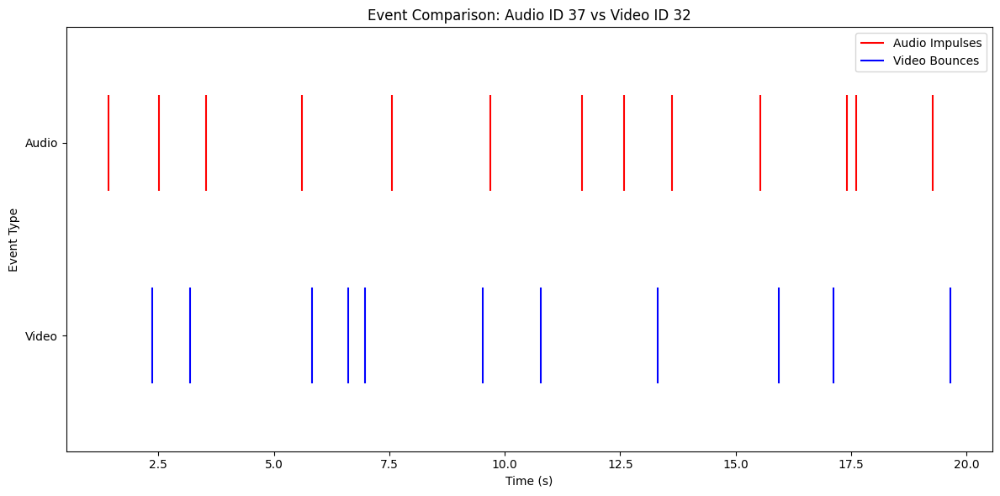

Visualizing match: Audio ID 38 vs Video ID 8


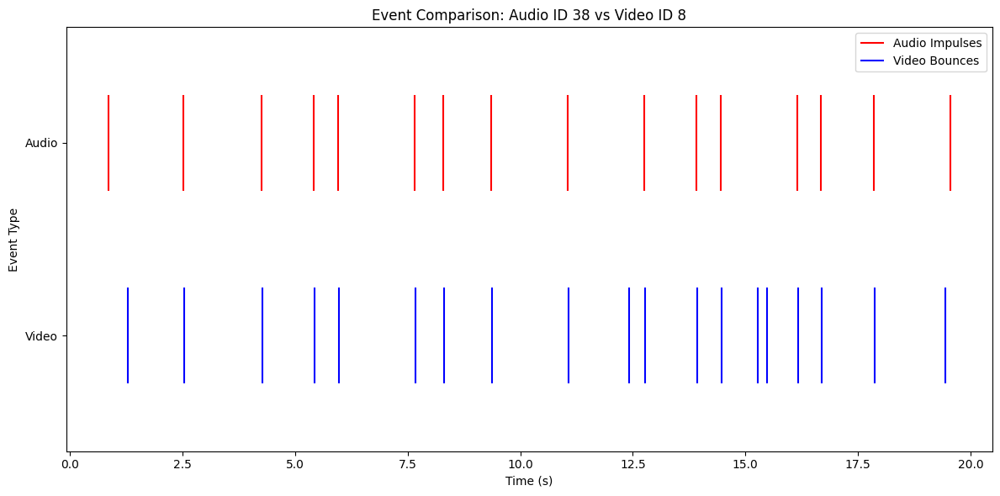

Visualizing match: Audio ID 39 vs Video ID 19


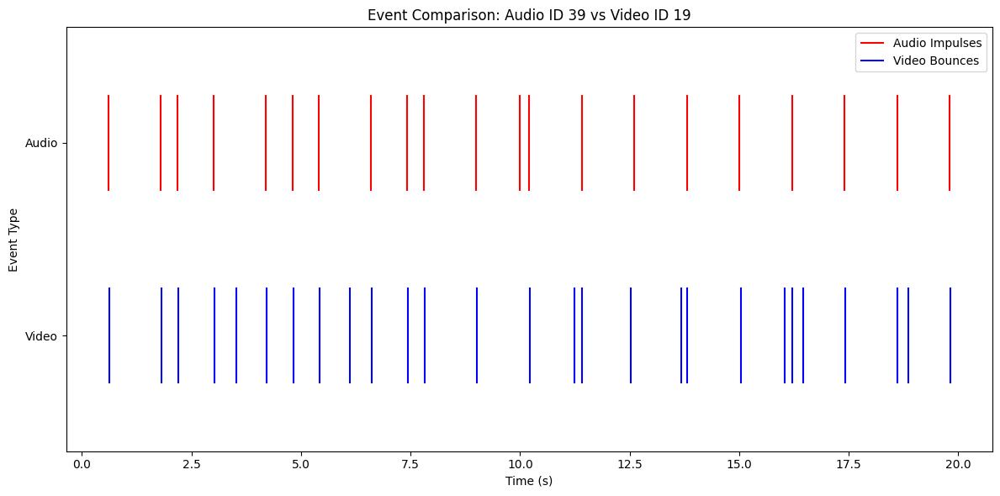

Visualizing match: Audio ID 4 vs Video ID 39


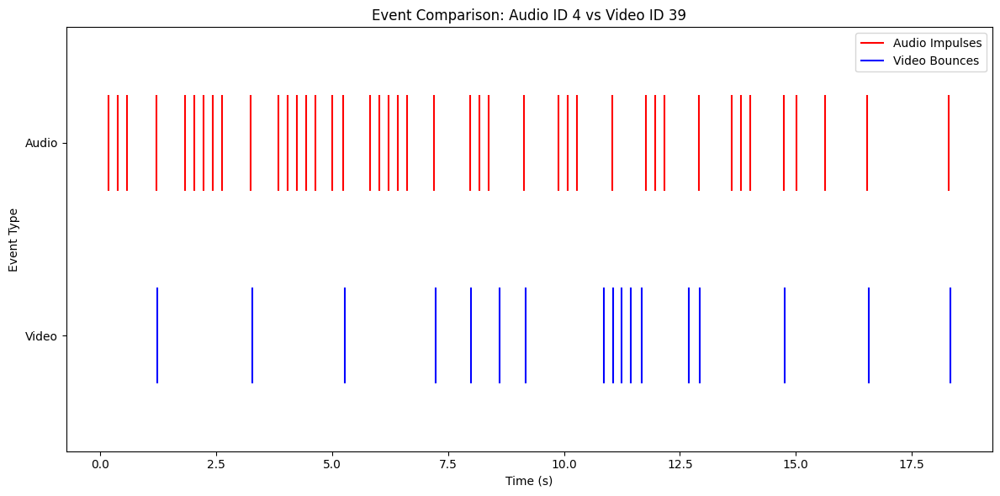

Visualizing match: Audio ID 40 vs Video ID 23


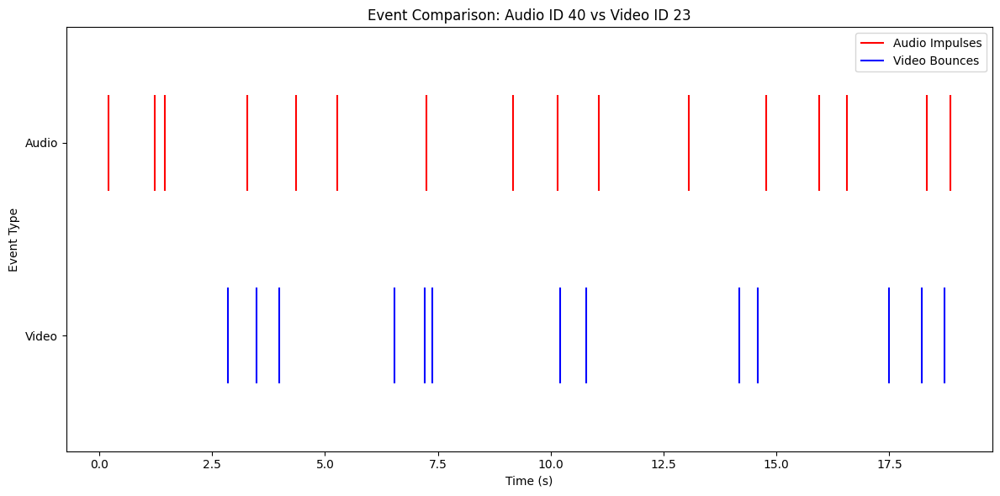

Visualizing match: Audio ID 41 vs Video ID 22


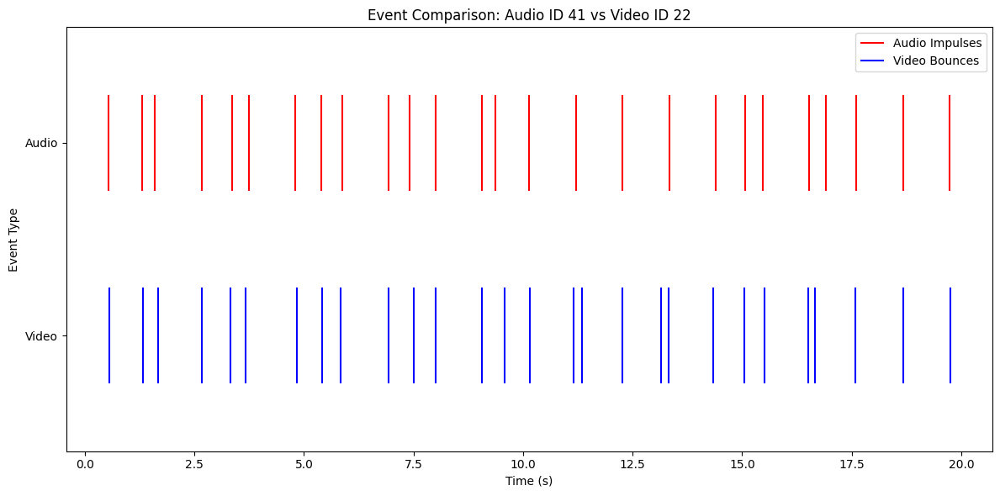

Visualizing match: Audio ID 42 vs Video ID 17


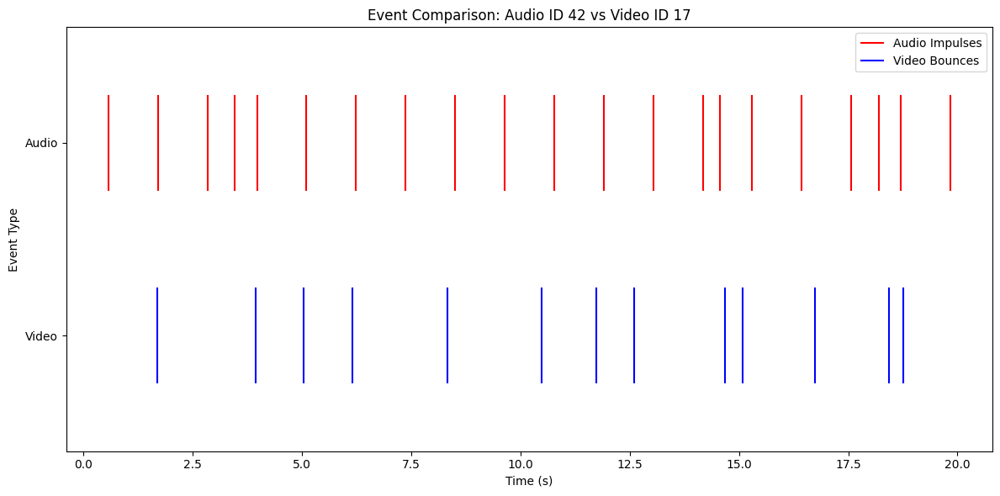

Visualizing match: Audio ID 43 vs Video ID 33


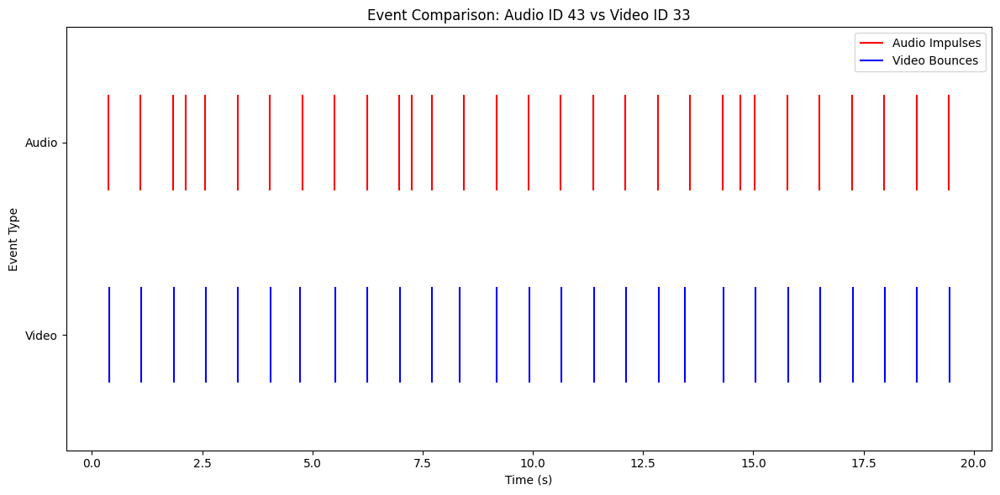

Visualizing match: Audio ID 44 vs Video ID 13


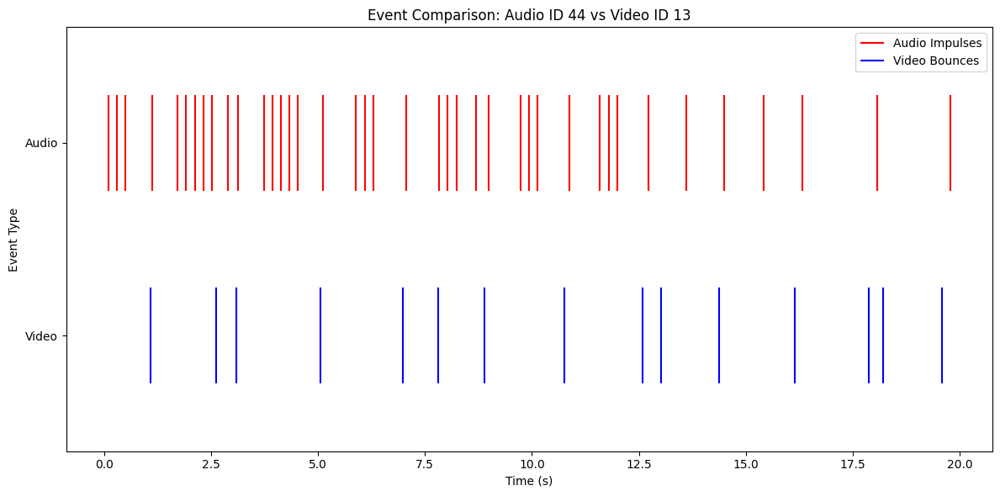

Visualizing match: Audio ID 45 vs Video ID 1


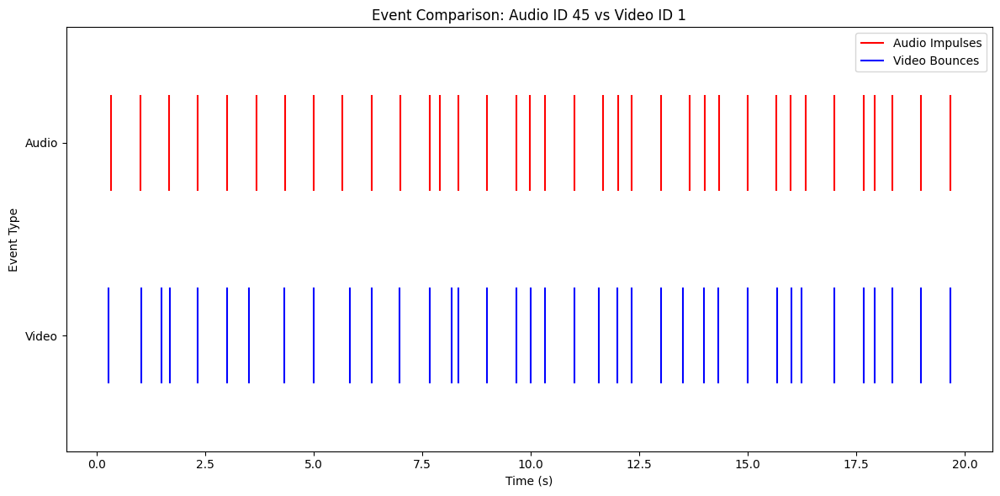

Visualizing match: Audio ID 5 vs Video ID 36


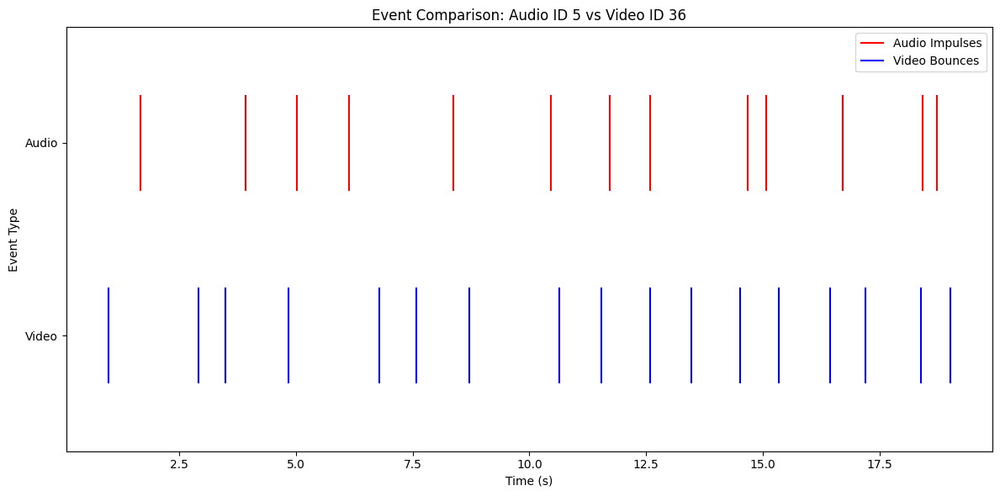

Visualizing match: Audio ID 6 vs Video ID 37


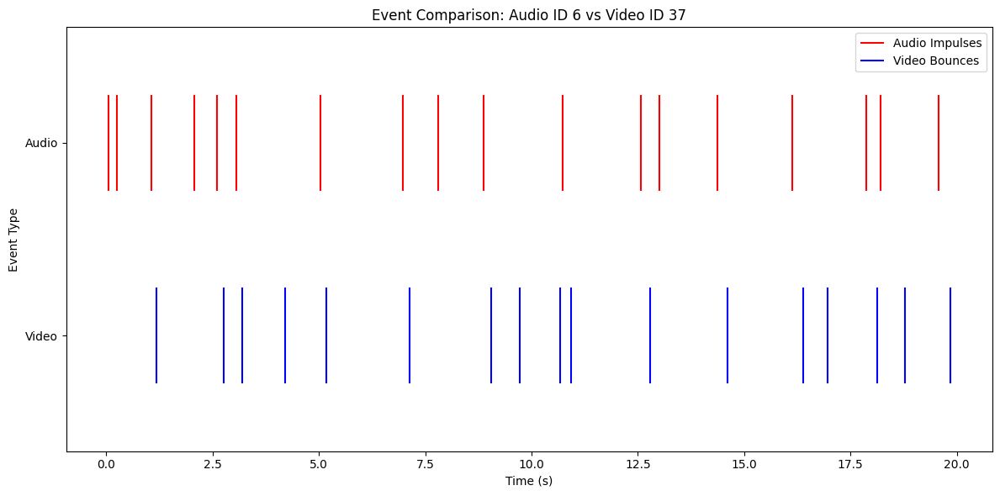

Visualizing match: Audio ID 7 vs Video ID 25


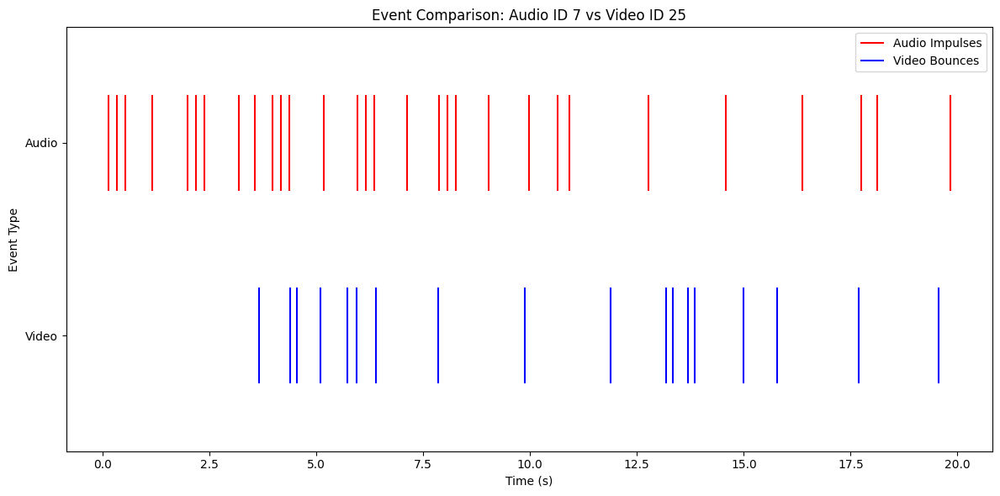

Visualizing match: Audio ID 8 vs Video ID 42


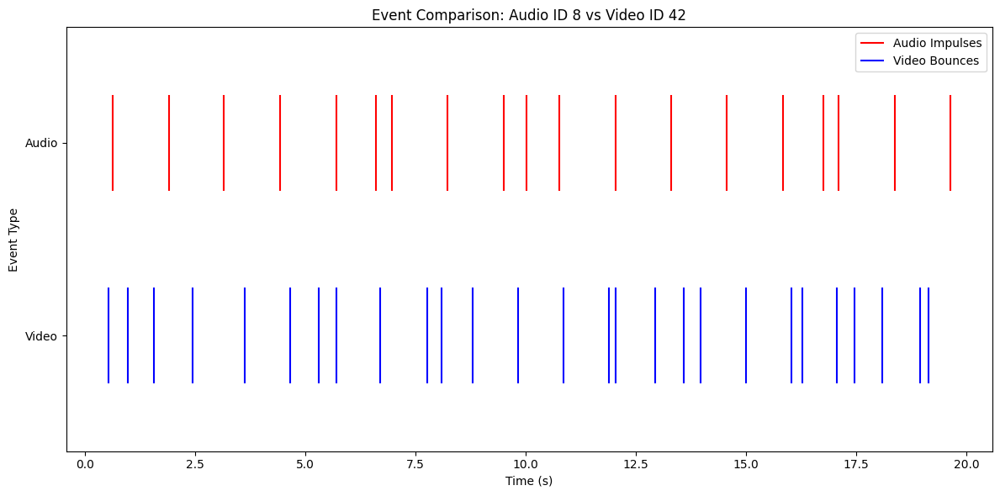

Visualizing match: Audio ID 9 vs Video ID 43


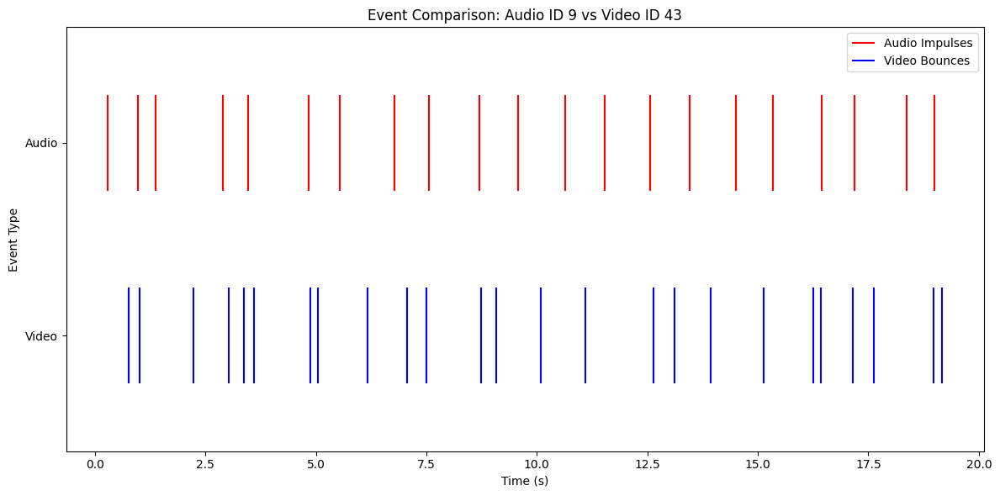

In [76]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_matched_audio_video(audio_id, video_id, audio_impacts, video_bounces):
    """Visualize matched audio impulses and video bounces on the same timeline."""
    # Extract data for the specific audio and video IDs
    audio_times = audio_impacts[audio_id]
    video_times = video_bounces[video_id]
    
    # Create a figure for visualization
    plt.figure(figsize=(12, 6))
    
    # Plot audio impulses
    plt.eventplot(audio_times, lineoffsets=1, colors='r', linelengths=0.5, label='Audio Impulses')
    
    # Plot video bounces
    plt.eventplot(video_times, lineoffsets=0, colors='b', linelengths=0.5, label='Video Bounces')
    
    # Add labels and legend
    plt.title(f'Event Comparison: Audio ID {audio_id} vs Video ID {video_id}')
    plt.xlabel('Time (s)')
    plt.ylabel('Event Type')
    plt.yticks([0, 1], ['Video', 'Audio'])
    plt.legend()
    
    # Show the plot
    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming `matches` contains the matched audio and video IDs
for match in matches:
    audio_id = match[0].split('_')[-1]  # Extract numeric ID from "audio_only_ID_<ID>"
    video_id = match[1].split('_')[-1]  # Extract numeric ID from "video_only_ID_<ID>"
    
    print(f"Visualizing match: Audio ID {audio_id} vs Video ID {video_id}")
    visualize_matched_audio_video(audio_id, video_id, audio_impacts, video_bounces)
